# 0.0 - Imports

In [1]:
import pandas as pd
import sqlite3
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import Image
from scipy.stats import zscore, linregress, mannwhitneyu, kruskal, spearmanr, entropy
from xgboost import XGBRegressor

### 0.1 - Helper Functions

In [2]:
def outlier_iqr(g, k=3):
    """
    Identifica outliers em uma série numérica pelo método do IQR.

    Responde às perguntas:
    "Quais valores de um grupo/item são anomalias extremas?"
    "Este ponto deve ser tratado como outlier na análise de sazonalidade/preço?"

    Parâmetros
    ----------
    g : pd.Series
        Série numérica ou grupo de dados a ser analisado (uso típico
        via groupby().transform() para isolar anomalias por item).
    k : float, opcional (padrão=3)
        Multiplicador do IQR. k=3 identifica outliers extremos;
        k=1.5 é o padrão clássico (mais sensível).

    Retorna
    -------
    mascara : pd.Series
        Booleana (True = outlier), mesmo tamanho e índice do input.
    """
    #1. Cálculo dos quartis e IQR
    q1, q3 = g.quantile([0.25, 0.75])
    iqr = q3 - q1
    
    #2. Classificação dos pontos fora dos limites
    return (g < q1 - k*iqr) | (g > q3 + k*iqr)

def top_n_outros(serie, n=10):
    """
    Agrupa as categorias menos frequentes de uma série sob o rótulo 'Outros'.

    Responde às perguntas:
    "Quais são as categorias dominantes de uma variável de alta cardinalidade?"
    "Como simplificar a visualização sem perder o peso das categorias menores?"

    Parâmetros
    ----------
    serie : pd.Series
        Coluna categórica que será contabilizada.
    n : int, opcional (padrão=10)
        Quantidade de categorias principais mantidas de forma explícita.

    Retorna
    -------
    contagem_agrupada : pd.Series
        Frequência das 'n' principais categorias mais a soma das
        demais agregada sob o rótulo 'Outros'.
    """
    #1. Contagem de frequência
    contagem = serie.value_counts()
    
    #2. Separação top-N vs. restante
    top = contagem.head(n)
    outros = contagem.iloc[n:].sum()
    
    #3. Concatenação do resultado final
    return pd.concat([top, pd.Series({"Outros": outros})])

def theil_u(x, y):
    """
    Calcula o coeficiente de incerteza de Theil (U) na direção x -> y.

    Responde às perguntas:
    "O quanto conhecer x reduz a incerteza sobre y?"
    "x prediz y melhor do que y prediz x (associação direcional)?"

    Parâmetros
    ----------
    x : pd.Series
        Variável categórica preditora.
    y : pd.Series
        Variável categórica predita.

    Retorna
    -------
    u : float
        Proporção da incerteza sobre y que é reduzida ao conhecer x.
        0 = x não ajuda a prever y | 1 = x prevê y perfeitamente.
    """
    #1. Tabela de contingência e entropia marginal de y
    cm = pd.crosstab(x, y)
    p_y = cm.sum(axis=0) / cm.sum().sum()
    h_y = entropy(p_y)

    if h_y == 0:
        return 0.0

    #2. Entropia condicional de y dado x
    h_y_given_x = sum(
        (cm.loc[idx].sum() / cm.sum().sum()) * entropy(cm.loc[idx] / cm.loc[idx].sum())
        for idx in cm.index
    )

    #3. Redução proporcional de incerteza
    return (h_y - h_y_given_x) / h_y

def criar_features_temporais(serie, n_lags=12):
    """
    Gera features de lag, média móvel e sazonalidade a partir de uma série temporal.

    Responde às perguntas:
    "Qual foi o valor do mesmo mês do ano passado (lag_12)?"
    "Qual a tendência recente (média móvel) antes deste ponto?"

    Parâmetros
    ----------
    serie : pd.Series
        Série temporal indexada por data (frequência mensal).
    n_lags : int, opcional (padrão=12)
        Reservado para uso futuro (expansão de lags); não usado nesta versão.

    Retorna
    -------
    df_feat : pd.DataFrame
        Features temporais (mes, trimestre, ano, tempo_idx, lags, médias móveis).
    """
    #1. Base da série e features de calendário
    df_feat = pd.DataFrame({"valor_total": serie})
    df_feat["mes"] = df_feat.index.month
    df_feat["trimestre"] = df_feat.index.quarter
    df_feat["ano"] = df_feat.index.year
    df_feat["tempo_idx"] = range(len(df_feat))

    #2. Features de lag (valores passados)
    for lag in [1, 2, 3, 12]:
        df_feat[f"lag_{lag}"] = df_feat["valor_total"].shift(lag)

    #3. Features de média móvel (tendência recente)
    df_feat["media_movel_3"] = df_feat["valor_total"].shift(1).rolling(3).mean()
    df_feat["media_movel_12"] = df_feat["valor_total"].shift(1).rolling(12).mean()

    return df_feat

def criar_features_temporais_trimestre(serie, n_lags=4):
    """
    Gera features de lag, média móvel e sazonalidade trimestral a partir de uma série temporal.

    Responde às perguntas:
    "Qual foi o valor do mesmo trimestre do ano passado (lag_4)?"
    "Qual a tendência recente (média móvel de 4 trimestres) antes deste ponto?"

    Parâmetros
    ----------
    serie : pd.Series
        Série temporal indexada por data (frequência trimestral, início QS).
    n_lags : int, opcional (padrão=4)
        Reservado para uso futuro (expansão de lags); não usado nesta versão.

    Retorna
    -------
    df_feat : pd.DataFrame
        Features temporais (trimestre, tempo_idx, lag_1, lag_4, media_movel_4).
    """
    #1. Base da série e features de calendário
    df_feat = pd.DataFrame({"valor_total": serie})
    df_feat["trimestre"] = df_feat.index.quarter
    df_feat["tempo_idx"] = range(len(df_feat))

    #2. Features de lag (valores passados)
    for lag in [1, 4]:
        df_feat[f"lag_{lag}"] = df_feat["valor_total"].shift(lag)

    #3. Features de média móvel (tendência recente)
    df_feat["media_movel_4"] = df_feat["valor_total"].shift(1).rolling(4).mean()

    return df_feat

### 0.2 - Loading Dataset

#### 0.2.1 - Caminho e Conexão do Banco de Dados

In [3]:
#1. Cria variavel para o caminho do Banco de Dados
CAMINHO_BANCO = "../assets/data/database.db"

#2. Conecta ao banco de dados
conexao = sqlite3.connect(CAMINHO_BANCO)
conexao.execute("PRAGMA temp_store = MEMORY;")

In [4]:
#3.Lista a tabela do Banco de Dados para validação do Schema
tabelas = pd.read_sql("SELECT name FROM sqlite_master WHERE type='table';", con=conexao)
print("Tabelas encontradas:")
print(tabelas)

Tabelas encontradas:
                     name
0            dim_material
1          dim_fornecedor
2                dim_uasg
3  fato_precos_praticados


#### 0.2.2 - Banco de Dados

##### 0.2.2.1 - Tabela dim_material

In [5]:
#Query customizavel para selecionar a tabela dim_material
query_material = "SELECT * FROM dim_material"

#Transforma a consulta SQL em Tabela
df_material = pd.read_sql(query_material, con=conexao)

#Verificação da tabela e colunas
print(f"A tabela dim_material possui {df_material.shape[0]} linhas e {df_material.shape[1]} colunas.\n")

A tabela dim_material possui 10916 linhas e 8 colunas.



### `dim_material` — catálogo de itens
 
| Coluna | Tipo | Significado |
|---|---|---|
| `codigo_item` | INTEGER (PK) | Código único do item no catálogo de materiais do governo |
| `codigo_classe` | INTEGER | Código da classe CATMAT
| `nome_classe` | TEXT | Descrição da classe |
| `codigo_grupo` | INTEGER | Código do grupo CATMAT |
| `nome_grupo` | TEXT | Descrição do grupo |
| `codigo_pdm` | INTEGER | Código do PDM (Padrão Descritivo de Material) — agrupa variações do mesmo tipo de material |
| `nome_pdm` | TEXT | Descrição do PDM |
| `descricao_item` | TEXT | Descrição completa e específica do item (mais granular, com especificações técnicas) |

##### 0.2.2.2 - Tabela dim_fornecedor

In [6]:
#Query customizavel para selecionar a tabela dim_fornecedor
query_fornecedor = "SELECT * FROM dim_fornecedor"

#Transforma a consulta SQL em Tabela
df_fornecedor = pd.read_sql(query_fornecedor, con=conexao)

#Verificação da tabela e colunas
print(f"A tabela dim_fornecedor possui {df_fornecedor.shape[0]} linhas e {df_fornecedor.shape[1]} colunas.\n")

A tabela dim_fornecedor possui 10235 linhas e 2 colunas.



### `dim_fornecedor` — fornecedores
 
| Coluna | Tipo | Significado |
|---|---|---|
| `ni_fornecedor` | TEXT (PK) | Número de Identificação do fornecedor (CNPJ, ou CPF para pessoa física) |
| `nome_fornecedor` | TEXT | Razão social / nome do fornecedor |

##### 0.2.2.3 - Tabela dim_usag

In [7]:
#Query customizavel para selecionar a tabela dim_usag
query_usag = "SELECT * FROM dim_uasg"

#Transforma a consulta SQL em Tabela
df_usag = pd.read_sql(query_usag, con=conexao)

#Verificação da tabela e colunas
print(f"A tabela dim_usag possui {df_usag.shape[0]} linhas e {df_usag.shape[1]} colunas.\n")

A tabela dim_usag possui 3687 linhas e 9 colunas.



### `dim_uasg` — unidades compradoras
 
UASG = Unidade Administrativa de Serviços Gerais (unidade específica de
um órgão que realiza a compra).
 
| Coluna | Tipo | Significado |
|---|---|---|
| `codigo_uasg` | TEXT (PK) | Código único da UASG |
| `nome_uasg` | TEXT | Nome da unidade compradora |
| `municipio` | TEXT | Município da UASG |
| `estado` | TEXT | UF |
| `codigo_orgao` | INTEGER | Código do órgão "pai" ao qual a UASG pertence |
| `nome_orgao` | TEXT | Nome do órgão |
| `poder` | TEXT | Poder da União (Executivo, Legislativo, Judiciário) |
| `esfera` | TEXT | Esfera administrativa (Federal, Estadual, Municipal) |

##### 0.2.2.4 - Tabela fato_precos_praticados

In [8]:
#Query customizavel para selecionar a tabela fato_precos_praticados
query_fato_precos_praticados = "SELECT * FROM fato_precos_praticados"

#Transforma a consulta SQL em Tabela
df_fato_precos_praticados = pd.read_sql(query_fato_precos_praticados, con=conexao)

#Verificação da tabela e colunas
print(f"A tabela fato_precos_praticados possui {df_fato_precos_praticados.shape[0]} linhas e {df_fato_precos_praticados.shape[1]} colunas.\n")

A tabela fato_precos_praticados possui 164680 linhas e 17 colunas.



### `fato_precos_praticados` — tabela fato
 
Cada linha representa um preço efetivamente praticado em uma compra específica.
 
| Coluna | Tipo | Significado |
|---|---|---|
| `id_compra_item` | TEXT | Identificador único do registro de compra (chave real da API) |
| `codigo_item_catalogo` | INTEGER (FK → dim_material) | Qual item foi comprado |
| `ni_fornecedor` | TEXT (FK → dim_fornecedor) | Quem vendeu |
| `codigo_uasg` | TEXT (FK → dim_uasg) | Quem comprou |
| `quantidade` | REAL | Quantidade comprada na transação |
| `preco_unitario` | REAL | Preço pago por unidade |
| `data_compra` | TEXT | Data em que a compra ocorreu |
| `data_resultado` | TEXT | Data em que o resultado/homologação da compra foi divulgado |

##### 0.2.2.5 - Schema Banco de Dados (STAR Schema)

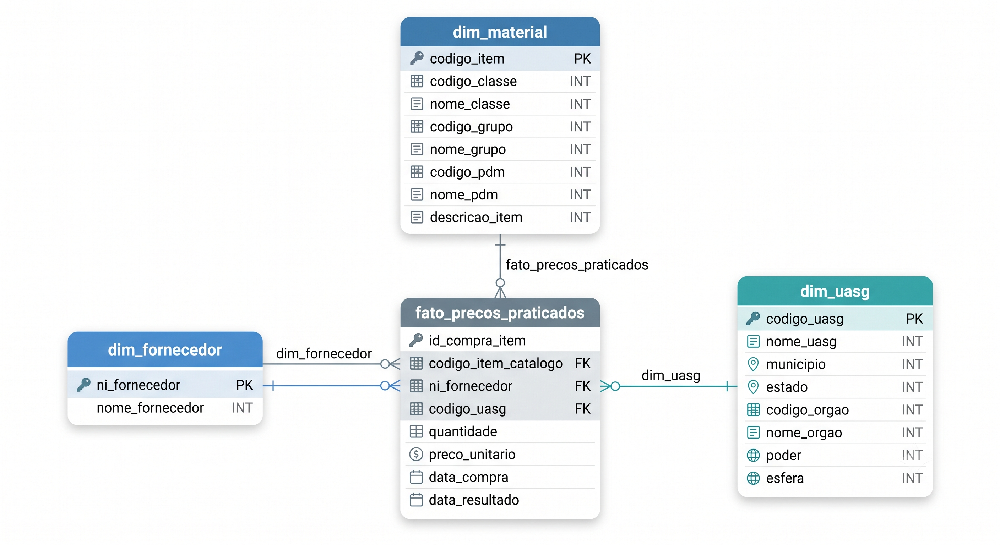

In [9]:
#Carrega o Schema do Banco de Dados
caminho_imagem = "../assets/img/schema_sem_tratamento.png"
Image (caminho_imagem)

**Ponto de atenção para a limpeza (Silver layer):** `data_compra` e
`data_resultado` vieram como TEXT da API — tratamento no passo 1.0 - Descrição dos Dados (para `datetime`)

#### 0.2.3 - Query para junção das tabelas em um único dataset

##### 0.2.3.1 - Query para construção do dataset

In [10]:
#1. Query customizavel para construção do dataset final consumido pelo streamlit
query_df_raw = """
SELECT
    f.id_compra_item,
    f.codigo_item_catalogo,
    f.ni_fornecedor,
    f.codigo_uasg,
    f.quantidade,
    f.preco_unitario,
    f.data_compra,
    f.data_resultado,
    m.codigo_classe,
    m.nome_classe,
    m.codigo_grupo,
    m.nome_grupo,
    m.codigo_pdm,
    m.nome_pdm,
    m.descricao_item,
    fo.nome_fornecedor,
    u.nome_uasg,
    u.municipio,
    u.estado,
    u.codigo_orgao,
    u.nome_orgao,
    u.poder,
    u.esfera
FROM fato_precos_praticados f
LEFT JOIN dim_material m ON f.codigo_item_catalogo = m.codigo_item
LEFT JOIN dim_fornecedor fo ON f.ni_fornecedor = fo.ni_fornecedor
LEFT JOIN dim_uasg u ON f.codigo_uasg = u.codigo_uasg
"""

##### 0.2.3.2 - Carrega a Query no Dataset df_raw e Fecha a Conexão com o Banco de Dados

In [11]:
#2.Trasforma a query em dataset Pandas e consulta tabela fato para validação no passo 4
df_raw = pd.read_sql_query(query_df_raw, conexao)
total_fato = conexao.execute("SELECT COUNT(*) FROM fato_precos_praticados").fetchone()[0]

#3.Fecha a conexão com o Banco de Dados
conexao.close()

#4. Mostra as linhas e colunas do dataset final e valida pela total_fato o left_join da query (linhas)
print(df_raw.shape, total_fato)

(164680, 23) 164680


##### 0.2.3.3 - Validações Finais do Dataset

In [12]:
#5. Validação de Contagem
assert df_raw.shape[0] == total_fato
print("linhas ok")

#6. Validacao de Duplicidade
assert df_raw["id_compra_item"].nunique() == df_raw.shape[0]
print("sem duplicidade")

#7. Validação de Amostra
amostra = df_raw.sample(1, random_state=42).iloc[0]
 
conexao = sqlite3.connect(CAMINHO_BANCO)
check = conexao.execute(
    "SELECT nome_classe FROM dim_material WHERE codigo_item = ?",
    (int(amostra["codigo_item_catalogo"]),)
).fetchone()
conexao.close()
 
assert amostra["nome_classe"] == check[0]
print("join ok")

#8. Validação de Nulos
df_raw.isna().sum().sort_values(ascending=False)

linhas ok
sem duplicidade
join ok


municipio               1110
poder                    915
data_compra              189
esfera                    10
ni_fornecedor              0
codigo_item_catalogo       0
id_compra_item             0
preco_unitario             0
quantidade                 0
codigo_uasg                0
data_resultado             0
nome_grupo                 0
codigo_classe              0
nome_classe                0
codigo_grupo               0
descricao_item             0
nome_pdm                   0
codigo_pdm                 0
nome_fornecedor            0
estado                     0
nome_uasg                  0
nome_orgao                 0
codigo_orgao               0
dtype: int64

# 1.0 - Descrição dos Dados

### Cópia de Segurança do dataset

In [13]:
df1 = df_raw.copy()

In [14]:
pd.set_option('display.max_columns', None)
df1.head(5)

,id_compra_item,codigo_item_catalogo,ni_fornecedor,codigo_uasg,quantidade,preco_unitario,data_compra,data_resultado,codigo_classe,nome_classe,codigo_grupo,nome_grupo,codigo_pdm,nome_pdm,descricao_item,nome_fornecedor,nome_uasg,municipio,estado,codigo_orgao,nome_orgao,poder,esfera
0,1350380500007202100028,12602,19806688000120,135038,30.0,208.75,2022-01-11,2022-01-11,5975,FERRAGENS E SUPRIMENTOS DE ELETRICIDADE,59,COMPONENTES DE EQUIPAMENTOS ELÉTRICOS E ELETRÔ...,4145,CAIXA DE PAREDE DE FONTE COM DISJUNTOR,"CAIXA DE PAREDE DE FONTE COM DISJUNTOR, NOME: ...",SANDU COMERCIO E DISTRIBUICAO DE PRODUTOS EIRELI,EMBRAPA RECURSOS GENETICOS/BRASILIA/DF,BRASÍLIA,DF,22202,EMPRESA BRASILEIRA DE PESQUISA AGROPECUARIA,E,F
1,1350380500007202100029,12602,19806688000120,135038,16.0,500.00,2022-01-11,2022-01-11,5975,FERRAGENS E SUPRIMENTOS DE ELETRICIDADE,59,COMPONENTES DE EQUIPAMENTOS ELÉTRICOS E ELETRÔ...,4145,CAIXA DE PAREDE DE FONTE COM DISJUNTOR,"CAIXA DE PAREDE DE FONTE COM DISJUNTOR, NOME: ...",SANDU COMERCIO E DISTRIBUICAO DE PRODUTOS EIRELI,EMBRAPA RECURSOS GENETICOS/BRASILIA/DF,BRASÍLIA,DF,22202,EMPRESA BRASILEIRA DE PESQUISA AGROPECUARIA,E,F
2,1350380500007202100030,12602,19806688000120,135038,50.0,90.50,2022-01-11,2022-01-11,5975,FERRAGENS E SUPRIMENTOS DE ELETRICIDADE,59,COMPONENTES DE EQUIPAMENTOS ELÉTRICOS E ELETRÔ...,4145,CAIXA DE PAREDE DE FONTE COM DISJUNTOR,"CAIXA DE PAREDE DE FONTE COM DISJUNTOR, NOME: ...",SANDU COMERCIO E DISTRIBUICAO DE PRODUTOS EIRELI,EMBRAPA RECURSOS GENETICOS/BRASILIA/DF,BRASÍLIA,DF,22202,EMPRESA BRASILEIRA DE PESQUISA AGROPECUARIA,E,F
3,1350380500007202100031,12602,19806688000120,135038,50.0,84.00,2022-01-11,2022-01-11,5975,FERRAGENS E SUPRIMENTOS DE ELETRICIDADE,59,COMPONENTES DE EQUIPAMENTOS ELÉTRICOS E ELETRÔ...,4145,CAIXA DE PAREDE DE FONTE COM DISJUNTOR,"CAIXA DE PAREDE DE FONTE COM DISJUNTOR, NOME: ...",SANDU COMERCIO E DISTRIBUICAO DE PRODUTOS EIRELI,EMBRAPA RECURSOS GENETICOS/BRASILIA/DF,BRASÍLIA,DF,22202,EMPRESA BRASILEIRA DE PESQUISA AGROPECUARIA,E,F
4,1350380500007202100032,12602,19806688000120,135038,50.0,164.80,2022-01-11,2022-01-11,5975,FERRAGENS E SUPRIMENTOS DE ELETRICIDADE,59,COMPONENTES DE EQUIPAMENTOS ELÉTRICOS E ELETRÔ...,4145,CAIXA DE PAREDE DE FONTE COM DISJUNTOR,"CAIXA DE PAREDE DE FONTE COM DISJUNTOR, NOME: ...",SANDU COMERCIO E DISTRIBUICAO DE PRODUTOS EIRELI,EMBRAPA RECURSOS GENETICOS/BRASILIA/DF,BRASÍLIA,DF,22202,EMPRESA BRASILEIRA DE PESQUISA AGROPECUARIA,E,F


### 1.1 - Data Dimensions

In [15]:
print('Number os Rows: {}'.format(df1.shape[0] ) )
print('Number os Columns: {}'.format(df1.shape[1] ) )

Number os Rows: 164680
Number os Columns: 23


### 1.2 - Data Types

In [16]:
df1.dtypes

id_compra_item              str
codigo_item_catalogo      int64
ni_fornecedor               str
codigo_uasg                 str
quantidade              float64
preco_unitario          float64
data_compra                 str
data_resultado              str
codigo_classe             int64
nome_classe                 str
codigo_grupo              int64
nome_grupo                  str
codigo_pdm                int64
nome_pdm                    str
descricao_item              str
nome_fornecedor             str
nome_uasg                   str
municipio                   str
estado                      str
codigo_orgao              int64
nome_orgao                  str
poder                       str
esfera                      str
dtype: object

### 1.4 - Check NA

In [17]:
df1.isna().sum()

id_compra_item             0
codigo_item_catalogo       0
ni_fornecedor              0
codigo_uasg                0
quantidade                 0
preco_unitario             0
data_compra              189
data_resultado             0
codigo_classe              0
nome_classe                0
codigo_grupo               0
nome_grupo                 0
codigo_pdm                 0
nome_pdm                   0
descricao_item             0
nome_fornecedor            0
nome_uasg                  0
municipio               1110
estado                     0
codigo_orgao               0
nome_orgao                 0
poder                    915
esfera                    10
dtype: int64

### 1.5 - Fillout NA (Segunda Fase do CRISP-DS)

**Decisão:** sem imputação global de nulos.

- Nulos por coluna: `data_compra`=189, `municipio`=1110, `poder`=915, `esfera`=10
- Tratamento pontual via `dropna()` em cada análise que usa a coluna (ex.: seção 4.0 dropa `data_compra` antes de agregar a série temporal)
- Preserva as demais linhas para análises que não dependem dessas colunas

### 1.6 - Change Types

In [18]:
#1. Muda id_compra_item e ni_fornecedor de str para category
df1["ni_fornecedor"] = df1["ni_fornecedor"].astype("category")

#2. Muda codigo_uasg de str para int
df1["codigo_uasg"] = df1["codigo_uasg"].astype(int)

#3. Muda codigo_uasg de data_compra e data_resultado str para datetime
df1["data_compra"] = pd.to_datetime(df1["data_compra"], errors="coerce")
df1["data_resultado"] = pd.to_datetime(df1["data_resultado"], errors="coerce")

In [19]:
df1.dtypes

id_compra_item                     str
codigo_item_catalogo             int64
ni_fornecedor                 category
codigo_uasg                      int64
quantidade                     float64
preco_unitario                 float64
data_compra             datetime64[us]
data_resultado          datetime64[us]
codigo_classe                    int64
nome_classe                        str
codigo_grupo                     int64
nome_grupo                         str
codigo_pdm                       int64
nome_pdm                           str
descricao_item                     str
nome_fornecedor                    str
nome_uasg                          str
municipio                          str
estado                             str
codigo_orgao                     int64
nome_orgao                         str
poder                              str
esfera                             str
dtype: object

In [20]:
# 4.Chegagem de quantos NaT nas datas (deve bater com os 189 nulos que você já tinha em data_compra)
df1["data_compra"].isna().sum(), df1["data_resultado"].isna().sum()

(np.int64(189), np.int64(0))

In [21]:
# 5. Confirmar que codigo_uasg virou int sem erro silencioso (nenhum valor virou 0 ou NaN por engano)
df1["codigo_uasg"].isna().sum()

np.int64(0)

### 1.7 - Estatistica Descritiva

In [22]:
num_attributes = df1.select_dtypes(include=['int64', 'float64'])
cat_attributes = df1.select_dtypes(exclude=['int64', 'float64', 'datetime64'])

#### 1.7.1 - Atributos Numéricos

In [23]:
#1.Dropa colunas irrelevantes para analise - Identificadores
num_attributes = num_attributes.drop(columns=["codigo_item_catalogo",
                                              "codigo_uasg",
                                              "codigo_classe",
                                              "codigo_grupo",
                                              "codigo_pdm",
                                              "codigo_orgao",
                                              ], errors='ignore')

#2. Tendencias Centrais - Media e Mediana
ct1 = pd.DataFrame(num_attributes.apply(np.mean)).T
ct2 = pd.DataFrame(num_attributes.apply(np.median)).T

#3. Analise de Dispersão - std, min, max, range, skew kur
d1 = pd.DataFrame(num_attributes.apply(np.std)).T
d2 = pd.DataFrame(num_attributes.apply(min)).T
d3 = pd.DataFrame(num_attributes.apply(max)).T
d4 = pd.DataFrame(num_attributes.apply (lambda x: x.max()-x.min())).T   # <- Range
d5 = pd.DataFrame(num_attributes.apply (lambda x: x.skew())).T          # <- Skew
d6 = pd.DataFrame(num_attributes.apply (lambda x: x.kurtosis())).T      # <- Kurtosis

#4. Concatenação e Transposição
m = pd.concat([d2, d3, d4, ct1, ct2, d1, d5, d6]).T.reset_index()
m.columns = ['attributes', 'min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis']
m

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,quantidade,1.0000,40642600.0,4.064260e+07,3049.550049,43.00,194693.845955,128.279997,20816.033193
1,preco_unitario,0.0001,42971971.0,4.297197e+07,3179.228844,20.24,224313.593824,131.703226,19469.040425


**Observações:**
- `quantidade` e `preco_unitario`: curtose ≈20.816 → distribuição extremamente assimétrica
- Poucas transações puxam a cauda (confirmado pela distância grande entre média e mediana, e pelo máximo)

#### 1.7.2 - Atributos Categoricos

In [24]:
#Contagem de Atributos categoricos por features
cat_attributes.apply(lambda x: x.unique().shape[0])

id_compra_item     164680
ni_fornecedor       10213
nome_classe             7
nome_grupo              2
nome_pdm              268
descricao_item       5985
nome_fornecedor     10118
nome_uasg            3671
municipio             935
estado                 27
nome_orgao           1806
poder                   3
esfera                  4
dtype: int64

**Observações:**
- CATMAT validado: 7 classes em 2 grupos
  - Grupo 61 - CONDUTORES ELÉTRICOS E EQUIPAMENTOS PARA GERAÇÃO E DISTRIBUIÇÃO DE ENERGIA: `6120` Transformadores para estação de força e de distribuição, `6145` Fios e cabos elétricos, `6150` Equipamentos diversos p/ geração e distribuição de energia
  - Grupo 59 - COMPONENTES ELÉTRICOS - COMPLEMENTAR: `5925` Disjuntores, `5930` Chaves elétricas, `5970` Isoladores elétricos e materiais isolantes, `5975` Ferragens e suprimentos de eletricidade
- 27 estados presentes, 3 poderes (Executivo, Legislativo, Judiciário)

**Ponto de atenção:** verificar `ni_fornecedor` (10.213 registros) vs. `nome_fornecedor` (10.118 registros) — checar se algum fornecedor tem mais de um CNPJ

In [25]:
#Verifica duplicidade de fornecedores pelo CNPJ
df_raw.groupby("nome_fornecedor")["ni_fornecedor"].nunique().sort_values(ascending=False).head(10)

nome_fornecedor
ECOMMERCE HN LTDA                                               5
NINJA SOM COMERCIO DE ELETRONICOS E MATERIAIS ELETRICOS LTDA    4
NORTEL SUPRIMENTOS INDUSTRIAIS LTDA                             4
LOJA ELETRICA LIMITADA                                          4
DIMENSIONAL BRASIL SOLUCOES LTDA                                4
CAMPOS EQUIPAMENTOS E REFRIGERACAO LTDA                         3
COMERCIAL ELETRICA P.J.LTDA                                     3
TCJM DISTRIBUIDORA E IMPORTADORA LTDA                           3
ROMAGNOLE PRODUTOS ELETRICOS S.A.                               3
ELETROLUZ MATERIAIS ELETRICOS LTDA                              3
Name: ni_fornecedor, dtype: int64

**Observação:**
- Usar `ni_fornecedor`, não `nome_fornecedor`, para manter razão 1:1
- Mesma razão social pode ter CNPJs diferentes por estado (2ª passagem do CRISP-DS)

### 1.8 - Tratamento de Outlier de Catalogação (Erro de Dado Pontual)

**Achado:**
- 4 lançamentos do item `ISOLADOR EPOXI` (`codigo_item_catalogo`=77127), todos em 03/12/2021
- Fornecedor Sartorius (equipamento de laboratório, não isolador elétrico) → comprador Instituto de Tecnologia em Imunobiológicos (Bio-Manguinhos/Fiocruz)
- Preço unitário: R$ 30-31 milhões
- Outras 69 compras do mesmo item custam R$ 4,49 – R$ 2.720,00 (~4 ordens de magnitude abaixo)
- Fornecedor/comprador não combinam com o item → indica erro de classificação de catálogo ou de preço na fonte, não compra real

**Decisão:**
- Excluir só essas 4 linhas: `codigo_item_catalogo == 77127` e `preco_unitario > R$ 1 milhão`
- Diferente da não-imputação de nulos (seção 1.5): aqui é valor presente e implausível, não ausência de dado
- Somam ~R$ 123 milhões e inflam o trimestre nov-dez/2021 acima de qualquer trimestre completo do resto da série, contaminando o backtest de projeção (seções 4.6/4.7)

In [26]:
#1. Identifica as 4 linhas do erro de catalogação: mesmo item (isolador epoxi),
# preço unitário ~4 ordens de magnitude acima do resto da base (R$4,49-R$2.720,00
# nas outras 69 compras do mesmo código)
outlier_catalogacao = (df1["codigo_item_catalogo"] == 77127) & (df1["preco_unitario"] > 1_000_000)

#2. Confere o efeito antes de remover
print(f"Linhas removidas: {outlier_catalogacao.sum()}")
print(f"Valor total removido: R$ {(df1.loc[outlier_catalogacao, 'quantidade'] * df1.loc[outlier_catalogacao, 'preco_unitario']).sum():,.2f}")

#3. Remove
df1 = df1[~outlier_catalogacao].copy()

Linhas removidas: 4
Valor total removido: R$ 123,044,592.06


### 1.9 - Tratamento de Outliers de Preço Incompatíveis com o Item (Erro de Dado Sistemático)

**Achado:**
- Padrão sistemático (além do caso pontual da 1.8): linhas com `preco_unitario` várias ordens de magnitude acima da mediana do próprio item (`codigo_item_catalogo`)
- Ex.: `CABO ELÉTRICO FLEXÍVEL` mediana R$ 11,00 → aparece a R$ 1.316.490,00 (razão ~120.000x)
- Ex.: `CHAVE PARTIDA ESTÁTICA` mediana R$ 2.224,25 → aparece a R$ 13.214.500,00 (razão ~5.941x)
- Itens comuns (cabo, fio, eletroduto, canaleta, barramento, chave elétrica simples), quantidade=1, comprador pequeno/não especializado (prefeitura, autarquia municipal) → consistente com erro de preenchimento

**Por que não é o mesmo caso da 1.8:** dezenas de casos, cada um com fornecedor/comprador diferente — não dá pra apontar uma única linha óbvia.

**Critério de remoção (3 filtros combinados, nenhum sozinho é suficiente):**
- **Razão relativa:** `preco_unitario` ≥ 1.000x a mediana de preço do próprio `codigo_item_catalogo`
- **Piso absoluto:** `preco_unitario` > R$ 500 mil (mesmo patamar da 1.8)
- **Exclusão das grandes concessionárias/geradoras** (CHESF, FURNAS, Eletronorte, EPE): compram legitimamente equipamento pesado de subestação nessa faixa de preço, mesmo sob código de catálogo genérico compartilhado com itens baratos

**Efeito:** preserva compras genuinamente caras de compradores comuns (ex. `TRANSFORMADOR POTÊNCIA` de universidade a R$ 1,1 milhão, razão ~2,5x sobre a mediana do item) e remove só os lançamentos estruturalmente incompatíveis com o item.

**SEGUNDA PASSAGEM DO CRISP-DS:** ajuste dos valores distorcidos.

**Decisão:** remoção documentada (mesma lógica da seção 1.8 — não é imputação de nulo).

In [27]:
#1. Grandes concessionárias/geradoras de energia — compram equipamento pesado de
# subestação legitimamente na faixa de milhões, mesmo sob códigos de catálogo genéricos
grandes_concessionarias = ["CHESF", "FURNAS", "ELETRONORTE", "CENTRAIS ELETRICAS DO NORTE", "EPE-CIA"]
eh_grande_concessionaria = df1["nome_uasg"].str.contains("|".join(grandes_concessionarias), case=False, na=False)

#2. Preço muito acima da mediana histórica do próprio item (razão relativa, não valor fixo)
mediana_por_item = df1.groupby("codigo_item_catalogo")["preco_unitario"].transform("median")
razao_mediana_item = df1["preco_unitario"] / mediana_por_item

#3. Critério combinado: preço absoluto alto (chão de R$500 mil, mesmo patamar da
# seção 1.8) E item comum vendido a preço de equipamento pesado (razão >= 1.000x
# a mediana do próprio item) E comprador que não é uma grande concessionária.
# O chão absoluto evita marcar como outlier itens baratíssimos (ex. mediana de
# R$1,50) cuja razão explode com qualquer variação normal de preço, sem magnitude
# suficiente pra ser um erro de dado.
outlier_preco_incompativel = (
    (df1["preco_unitario"] > 500_000) & (razao_mediana_item >= 1000) & (~eh_grande_concessionaria)
)

#4. Confere o efeito antes de remover
print(f"Linhas removidas: {outlier_preco_incompativel.sum()}")
print(f"Valor total removido: R$ {(df1.loc[outlier_preco_incompativel, 'quantidade'] * df1.loc[outlier_preco_incompativel, 'preco_unitario']).sum():,.2f}")

#5. Remove
df1 = df1[~outlier_preco_incompativel].copy()

Linhas removidas: 43
Valor total removido: R$ 99,732,334.60


# 2.0 - Feature Engineering

### Cópia de Segurança do dataset

In [28]:
df2 = df1.copy()

### 2.1 - Mapa Mental a partir da Alavanca de Negócio

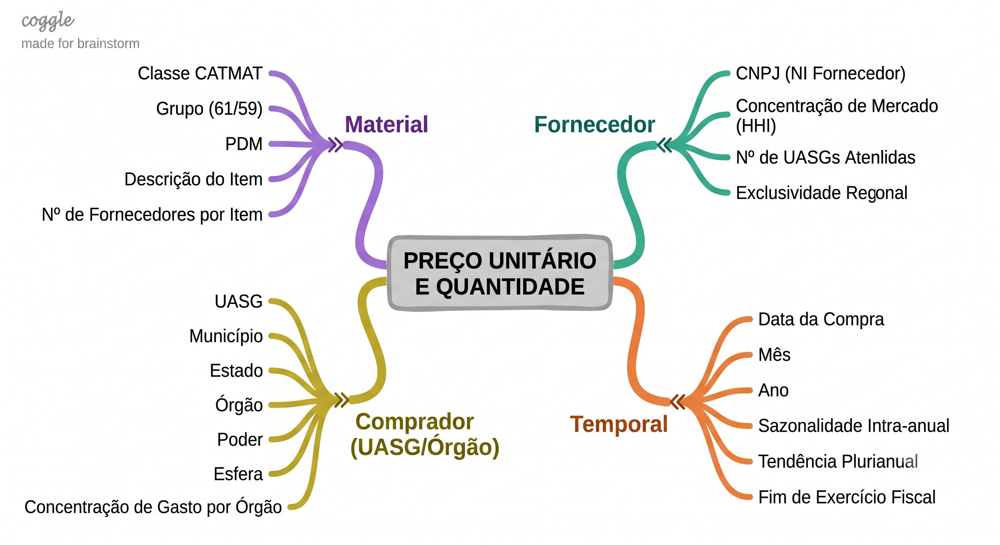

In [29]:
#Carrega o Schema do Banco de Dados
caminho_imagem2 = "../assets/img/mapa_mental.png"
Image (caminho_imagem2)

### 2.2 - Criação de Hipoteses

**ALAVANCAS DE NEGÓCIO**: `quantidade`; `preco_unitario`

#### H1 - Economia na Quantidade Comprada

- **P:** o preço unitário sofre desconto conforme a quantidade comprada aumenta dentro do mesmo item?

#### H2 - Variabilidade de Preço entre Fornecedores e UASGs

- **P:** o preço varia mais por causa do fornecedor ou por causa do onde/quando (UASGs/tempo)?

#### H3 - Impacto da Sazonalidade no Preço e na Quantidade (Verificação dos Outliers)

- **P:** o preço e a quantidade de itens sofrem sazonalidade durante o ano conforme demanda?

#### H4 - Regularidade de Consumo (monotonia)

- **P:** a regularidade de consumo implica em fornecedor concentrado?

### 2.3 - Feature Engineering

### 2.3.1 - Enginnering no Preço

In [30]:
#1. Valor Total (Quantidade x Preço Unitário)
df2["valor_total"] = df2["quantidade"] * df2["preco_unitario"]
df2["percentil_valor_total"] = df2["valor_total"].rank(pct=True)

### 2.3.2 - Enginnering no Tempo

In [31]:
#2. Separação por mês, trimestre e exercicio fiscal baseado na feature data_compra
df2["mes_compra"] = df2["data_compra"].dt.month
df2["trimestre_compra"] = df2["data_compra"].dt.quarter
df2["fim_exercicio_fiscal"] = df2["mes_compra"].isin([11, 12]).astype(int)

### 2.3.3 - Enginnering de Outliers

In [32]:
#3. Utilizado a função outlier_iqr (0.1 - Helper Funcitions) Isolamos os outliers
df2["outlier_preco_item"] = df2.groupby("codigo_item_catalogo")["preco_unitario"].transform(outlier_iqr)
df2["outlier_quantidade_item"] = df2.groupby("codigo_item_catalogo")["quantidade"].transform(outlier_iqr)

### 2.3.4 - Enginnering de Regularidade de Consumo (Analise baseada em Monotonia e Strain - Ciencia do Esporte)

In [33]:
#4. Criação do Índice de Regularidade de Consumo

#4.1 - Agrupamento do valor mensal de item
valor_mensal_item = df2.dropna(subset=["data_compra"]).groupby(
    ["codigo_item_catalogo", pd.Grouper(key="data_compra", freq="ME")]
)["valor_total"].sum()

#4.2 - Criação da regularidade de consumo a partir do valor mensal do item
regularidade_consumo = valor_mensal_item.groupby("codigo_item_catalogo").apply(
    lambda x: x.mean() / x.std() if x.std() > 0 else np.nan
)

#4.3 - Valor mensal do item e número de meses ativo
gasto_total_item = valor_mensal_item.groupby("codigo_item_catalogo").sum()
n_meses_ativos = valor_mensal_item.groupby("codigo_item_catalogo").count()

#4.4 - Criação do indice de dependencia usando log (normalização de escalas)
indice_dependencia = np.log1p(gasto_total_item) * regularidade_consumo

#4.5 - Criação de um dataframe original para a regularidade de consumo
df_regularidade = pd.DataFrame({
    "regularidade_consumo": regularidade_consumo,
    "gasto_total": gasto_total_item,
    "indice_dependencia": indice_dependencia,
    "n_meses_ativos": n_meses_ativos,
}).query("n_meses_ativos >= 6")

#4.6 - Criação do Indice de Dependencia
df_regularidade["z_regularidade"] = zscore(df_regularidade["regularidade_consumo"])
df_regularidade["z_gasto"] = zscore(np.log1p(df_regularidade["gasto_total"]))
df_regularidade["indice_dependencia_v2"] = df_regularidade["z_regularidade"] + df_regularidade["z_gasto"]

In [34]:
#5. Dataset Final com o Feature Enginnering
df2 = df2.merge(
    df_regularidade[["regularidade_consumo", "gasto_total", "indice_dependencia_v2"]],
    on="codigo_item_catalogo",
    how="left",
)

# 3.0 - Analise Exploratória de Dados (EDA)

### Cópia de Segurança do dataset

In [35]:
df3 = df2.copy()

### Estatistica Descritiva do Dataset

In [36]:
print(df3.shape)
df3.dtypes

(164633, 33)


id_compra_item                        str
codigo_item_catalogo                int64
ni_fornecedor                    category
codigo_uasg                         int64
quantidade                        float64
preco_unitario                    float64
data_compra                datetime64[us]
data_resultado             datetime64[us]
codigo_classe                       int64
nome_classe                           str
codigo_grupo                        int64
nome_grupo                            str
codigo_pdm                          int64
nome_pdm                              str
descricao_item                        str
nome_fornecedor                       str
nome_uasg                             str
municipio                             str
estado                                str
codigo_orgao                        int64
nome_orgao                            str
poder                                 str
esfera                                str
valor_total                       

### 3.1 - Analise Univariada

#### 3.1.1 - Variaveis Numéricas

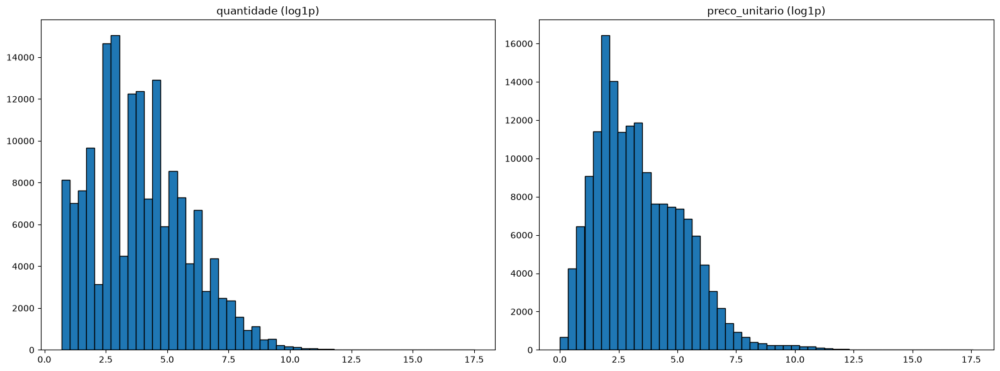

In [37]:
# Transformação em log para verificar distribuição de quantidade e preço unitário
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].hist(np.log1p(df3["quantidade"]), bins=50, edgecolor="black")
axes[0].set_title("quantidade (log1p)")
axes[1].hist(np.log1p(df3["preco_unitario"]), bins=50, edgecolor="black")
axes[1].set_title("preco_unitario (log1p)")
plt.tight_layout()
plt.show()

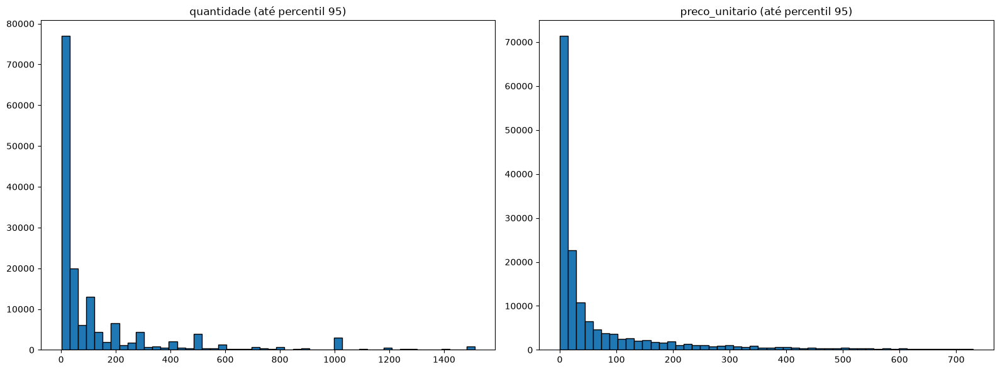

In [38]:
# Histograma "zoom" 95% para eliminando a cauda da visualização 
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
lim_qtd = df3["quantidade"].quantile(0.95)
lim_preco = df3["preco_unitario"].quantile(0.95)

axes[0].hist(df3[df3["quantidade"] <= lim_qtd]["quantidade"], bins=50, edgecolor="black")
axes[0].set_title("quantidade (até percentil 95)")
axes[1].hist(df3[df3["preco_unitario"] <= lim_preco]["preco_unitario"], bins=50, edgecolor="black")
axes[1].set_title("preco_unitario (até percentil 95)")
plt.tight_layout()
plt.show()

**Observação:**
- Histograma em escala linear não é interpretável (assimetria extrema, curtose ~20.000)
- Leitura feita em escala log e por percentil

#### 3.1.2 - Variaveis Categóricas

In [39]:
cat_attributes.nunique().sort_values(ascending=False)

id_compra_item     164680
ni_fornecedor       10213
nome_fornecedor     10118
descricao_item       5985
nome_uasg            3671
nome_orgao           1806
municipio             934
nome_pdm              268
estado                 27
nome_classe             7
esfera                  3
nome_grupo              2
poder                   2
dtype: int64

Separação por Cardinalidade

- Baixa Cardinalidade: `nome_classe`, `nome_grupo`, `estado`, `poder`, `esfera`

- Alta Cardinalidade: `nome_fornecedor`, `nome_uasg`, `nome_orgao`, `municipio`, `descricao_item`

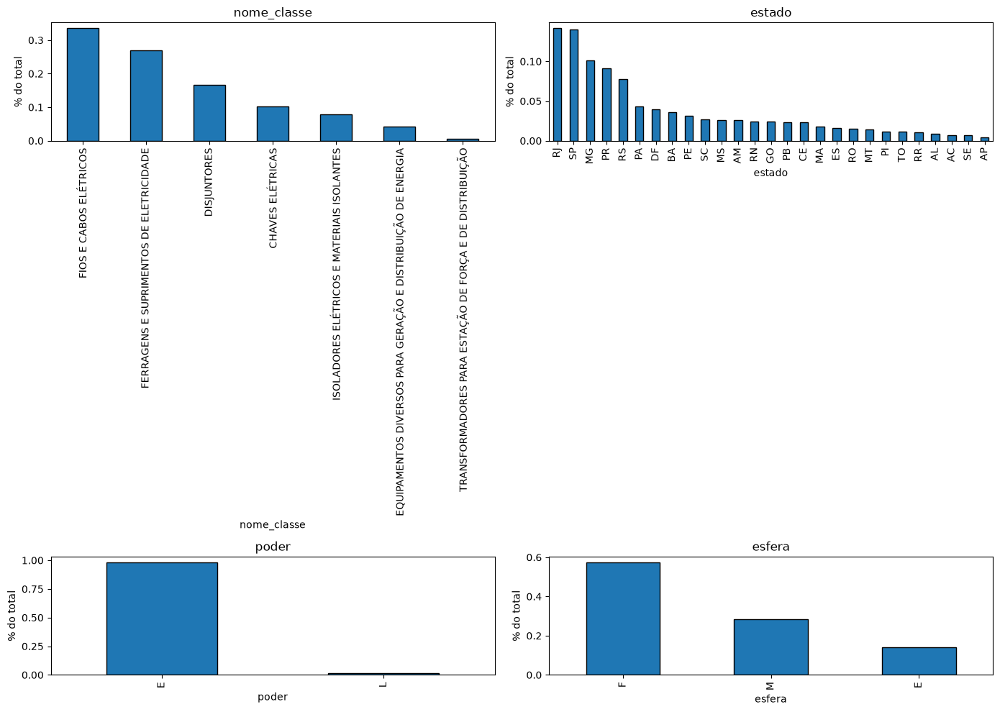

In [40]:
# Baixa Cardinalidade - `nome_classe`, `nome_grupo`, `estado`, `poder`, `esfera`

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

for ax, col in zip(axes.flat, ["nome_classe", "estado", "poder", "esfera"]):
    df3[col].value_counts(normalize=True).plot(kind="bar", ax=ax, edgecolor="black")
    ax.set_title(col)
    ax.set_ylabel("% do total")

plt.tight_layout()
plt.show()

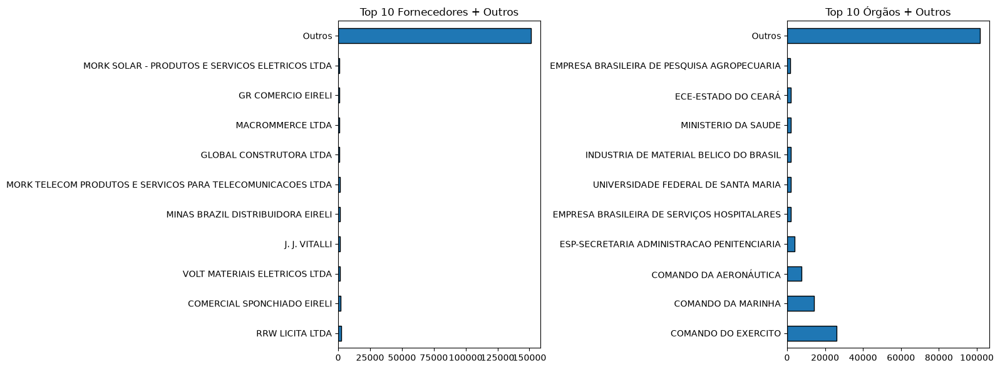

In [41]:
# Alta Cardinalidade - `nome_fornecedor`, `nome_uasg`, `nome_orgao`, `municipio`, `descricao_item`

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
top_n_outros(df3["nome_fornecedor"]).plot(kind="barh", ax=axes[0], edgecolor="black")
axes[0].set_title("Top 10 Fornecedores + Outros")

top_n_outros(df3["nome_orgao"]).plot(kind="barh", ax=axes[1], edgecolor="black")
axes[1].set_title("Top 10 Órgãos + Outros")

plt.tight_layout()
plt.show()

### 3.2 - Analise Bivariada

#### H1 - Economia na Quantidade Comprada

- **P:** o preço unitário sofre desconto conforme a quantidade comprada aumenta dentro do mesmo item?
- **R: Verdadeiro**
  - A cada 1% de aumento na quantidade, o preço cai ~0,49%
  - R²=0,27 (27% da variação do preço explicada — outras variáveis também influenciam)

slope=-0.487  r=-0.523  r2=0.274  p=0.00e+00  n=153598


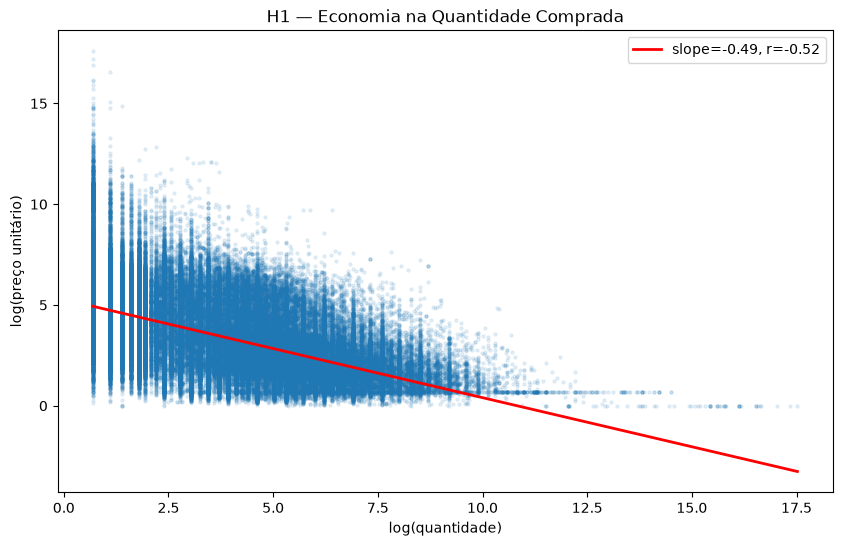

In [42]:
#1. Filtra itens com pelo menos 10 transacoes, para a regressao fazer sentido
freq_item = df3.groupby("codigo_item_catalogo")["id_compra_item"].transform("count")
sub = df3[freq_item >= 10].copy()

#2. Normalização da Distribuição das variaveis Quantidade e Preço Uniário
x = np.log1p(sub["quantidade"])
y = np.log1p(sub["preco_unitario"])

#3. Regressão linear para analise de quantidade x preço unitário
slope, intercept, r, p, se = linregress(x, y)
print(f"slope={slope:.3f}  r={r:.3f}  r2={r**2:.3f}  p={p:.2e}  n={len(sub)}")

fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(x, y, alpha=0.1, s=5)
x_line = np.linspace(x.min(), x.max(), 100)
ax.plot(x_line, intercept + slope * x_line, color="red", linewidth=2, label=f"slope={slope:.2f}, r={r:.2f}")
ax.set_xlabel("log(quantidade)")
ax.set_ylabel("log(preço unitário)")
ax.set_title("H1 — Economia na Quantidade Comprada")
ax.legend()
plt.show()

**Aprofundamento H1.1 — Produtos Atípicos dentro da Classe (Preço e Quantidade Medianos)**

- **P:** existem produtos (`codigo_item_catalogo`) cujo preço unitário mediano ou quantidade mediana comprada destoam do padrão da própria `nome_classe`?
- **R:** Sim, mas em proporção menor do que com a média (ver nota abaixo). Entre 2,3% (Fios e Cabos Elétricos) e 13,0% (Isoladores Elétricos) dos produtos por classe têm preço mediano atípico (IQR k=3, dentro da própria classe); entre 2,0% e 10,3% têm quantidade mediana atípica. No agregado das 7 classes (n=3.510 produtos), ~6,5% têm preço mediano outlier e ~3,8% têm quantidade mediana outlier. Ferragens e Suprimentos e Disjuntores concentram os outliers de preço em termos absolutos (83 e 55 produtos).
- **Nota (mediana em vez de média):** a versão original deste aprofundamento usava a média por produto; trocada pela mediana porque poucas transações extremas dentro do mesmo item (a mesma classe de erro de preenchimento já tratada nas seções 1.8/1.9) distorcem a média sem refletir o preço/quantidade típicos do produto — mesmo raciocínio de robustez já aplicado em H1.3 (quantidade/preço de referência) e H2 (comparação por mediana do CV). O efeito foi grande em produtos com poucas transações: Transformadores caiu de 17,2% (5 de 29 produtos) para 3,4% (1 de 29) de outliers de preço — a média estava sendo puxada por poucos lançamentos extremos dentro do próprio produto, não por uma diferença real de padrão dentro da classe.

                                                    n_produtos  \
nome_classe                                                      
CHAVES ELÉTRICAS                                           400   
DISJUNTORES                                                474   
EQUIPAMENTOS DIVERSOS PARA GERAÇÃO E DISTRIBUIÇ...         126   
FERRAGENS E SUPRIMENTOS DE ELETRICIDADE                   1160   
FIOS E CABOS ELÉTRICOS                                    1136   
ISOLADORES ELÉTRICOS E MATERIAIS ISOLANTES                 185   
TRANSFORMADORES PARA ESTAÇÃO DE FORÇA E DE DIST...          29   

                                                    outliers_preco  \
nome_classe                                                          
CHAVES ELÉTRICAS                                                25   
DISJUNTORES                                                     55   
EQUIPAMENTOS DIVERSOS PARA GERAÇÃO E DISTRIBUIÇ...              13   
FERRAGENS E SUPRIMENTOS DE ELETRICIDADE                

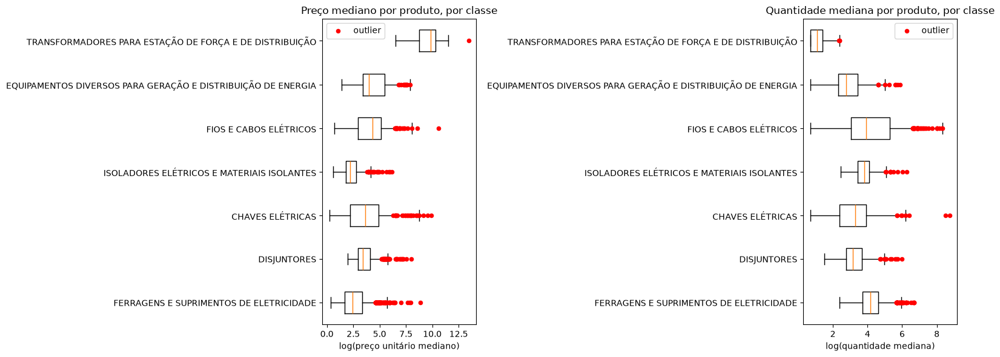

In [43]:
#1. Perfil mediano por produto (grão = codigo_item_catalogo), dentro do mesmo recorte de H1 (>=10 transações/item)
#   Mediana em vez de média: menos sensível a poucas transações extremas dentro do próprio produto
#   (mesmo raciocínio de robustez já usado em H1.3/H2), dando uma leitura mais fiel do preço/quantidade
#   típicos do item.
perfil_produto = sub.groupby(["codigo_item_catalogo", "nome_classe"]).agg(
    preco_unitario_mediano=("preco_unitario", "median"),
    quantidade_mediana=("quantidade", "median"),
).reset_index()

#2. Outlier do preço mediano e da quantidade mediana, calculado dentro de cada classe (outlier_iqr, seção 0.1)
perfil_produto["outlier_preco_mediano"] = perfil_produto.groupby("nome_classe")["preco_unitario_mediano"].transform(outlier_iqr)
perfil_produto["outlier_quantidade_mediana"] = perfil_produto.groupby("nome_classe")["quantidade_mediana"].transform(outlier_iqr)

#3. Resumo por classe: quantos produtos, quantos outliers e %
resumo_perfil_classe = perfil_produto.groupby("nome_classe").agg(
    n_produtos=("codigo_item_catalogo", "count"),
    outliers_preco=("outlier_preco_mediano", "sum"),
    outliers_quantidade=("outlier_quantidade_mediana", "sum"),
)
resumo_perfil_classe["pct_outliers_preco"] = (resumo_perfil_classe["outliers_preco"] / resumo_perfil_classe["n_produtos"] * 100).round(1)
resumo_perfil_classe["pct_outliers_quantidade"] = (resumo_perfil_classe["outliers_quantidade"] / resumo_perfil_classe["n_produtos"] * 100).round(1)
print(resumo_perfil_classe)

#4. Boxplot lado a lado: preço mediano e quantidade mediana por produto, agrupados por classe
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
classes = perfil_produto["nome_classe"].unique()

#5. Cria o Boxplot de preços dos itens
dados_preco = [np.log1p(perfil_produto.loc[perfil_produto["nome_classe"] == c, "preco_unitario_mediano"]) for c in classes]
axes[0].boxplot(dados_preco, tick_labels=classes, showfliers=False, orientation="horizontal")
outliers_preco = perfil_produto[perfil_produto["outlier_preco_mediano"]]
axes[0].scatter(np.log1p(outliers_preco["preco_unitario_mediano"]),
                [list(classes).index(c) + 1 for c in outliers_preco["nome_classe"]],
                color="red", s=20, zorder=3, label="outlier")
axes[0].set_xlabel("log(preço unitário mediano)")
axes[0].set_title("Preço mediano por produto, por classe")
axes[0].legend()

#6. Cria o Boxplot de quantidade de itens
dados_qtd = [np.log1p(perfil_produto.loc[perfil_produto["nome_classe"] == c, "quantidade_mediana"]) for c in classes]
axes[1].boxplot(dados_qtd, tick_labels=classes, showfliers=False, orientation="horizontal")
outliers_qtd = perfil_produto[perfil_produto["outlier_quantidade_mediana"]]
axes[1].scatter(np.log1p(outliers_qtd["quantidade_mediana"]),
                [list(classes).index(c) + 1 for c in outliers_qtd["nome_classe"]],
                color="red", s=20, zorder=3, label="outlier")
axes[1].set_xlabel("log(quantidade mediana)")
axes[1].set_title("Quantidade mediana por produto, por classe")
axes[1].legend()

plt.tight_layout()
plt.show()

**Aprofundamento H1.2 — Elasticidade Preço-Quantidade por Grupo de Material (CATMAT)**

- **P:** o desconto por quantidade (H1) é uniforme entre os dois grupos CATMAT — "Componentes Elétricos" (grupo 59) e "Condutores Elétricos e Equipamentos para Geração e Distribuição de Energia" (grupo 61) — ou existe diferença relevante de magnitude?
- **R:** Não é uniforme. Grupo 61 (Condutores/Equipamentos de Geração e Distribuição) tem elasticidade mais forte e melhor ajuste: slope=-0,596, r²=0,468, n=60.116. Grupo 59 (Componentes Elétricos/Eletrônicos) tem elasticidade mais fraca: slope=-0,392, r²=0,181, n=93.482. O slope agregado da H1 original (-0,487) fica exatamente entre os dois, como esperado de uma mistura das duas populações — confirma que o desconto por quantidade é heterogêneo entre os grupos, mais acentuado em condutores/equipamentos de geração e distribuição de energia.

nulos em nome_grupo: 0
COMPONENTES DE EQUIPAMENTOS ELÉTRICOS E ELETRÔNICOS: slope=-0.392  r2=0.181  p=0.00e+00  n=93482
CONDUTORES ELÉTRICOS E EQUIPAMENTOS PARA GERAÇÃO  E  DISTRI-BUIÇÃO DE ENERGIA: slope=-0.596  r2=0.468  p=0.00e+00  n=60116


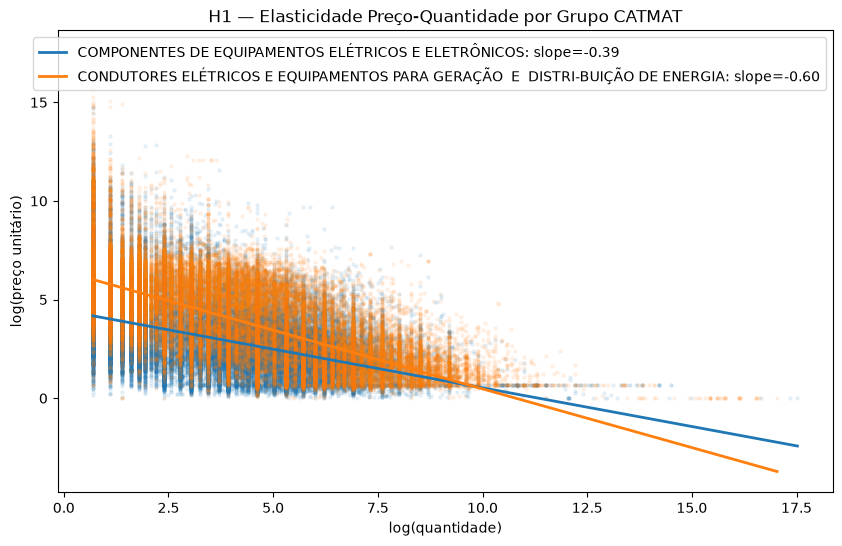

In [44]:
#1. Checagem defensiva de nulos em nome_grupo antes de agrupar
print(f"nulos em nome_grupo: {sub['nome_grupo'].isna().sum()}")

#2. Regressão log-log separada por grupo CATMAT, sobre o mesmo recorte de H1 (sem filtro adicional de
#   outlier, para manter comparabilidade com o slope geral da célula anterior)
resultados_grupo = {}

fig, ax = plt.subplots(figsize=(10, 6))
for grupo, dados in sub.groupby("nome_grupo"):
    x_g = np.log1p(dados["quantidade"])
    y_g = np.log1p(dados["preco_unitario"])
    slope_g, intercept_g, r_g, p_g, se_g = linregress(x_g, y_g)
    resultados_grupo[grupo] = dict(slope=slope_g, intercept=intercept_g, r=r_g, r2=r_g**2, p=p_g, n=len(dados))
    print(f"{grupo}: slope={slope_g:.3f}  r2={r_g**2:.3f}  p={p_g:.2e}  n={len(dados)}")

    ax.scatter(x_g, y_g, alpha=0.08, s=5)
    x_line = np.linspace(x_g.min(), x_g.max(), 100)
    ax.plot(x_line, intercept_g + slope_g * x_line, linewidth=2, label=f"{grupo}: slope={slope_g:.2f}")

ax.set_xlabel("log(quantidade)")
ax.set_ylabel("log(preço unitário)")
ax.set_title("H1 — Elasticidade Preço-Quantidade por Grupo CATMAT")
ax.legend()
plt.show()

**Aprofundamento H1.3 — Tradução da Elasticidade em R$**

- **P:** o que a queda de preço estimada (a cada 1% de aumento de quantidade, e ao dobrar a quantidade) representa em R$, para uma compra de referência e para o gasto total já observado?
- **R:**
  - Efeito marginal (+1% de quantidade), avaliado na quantidade mediana de cada recorte: Geral -R$0,14/un. (-0,49%, qtd mediana=44); Grupo 59 -R$0,07/un. (-0,40%, qtd mediana=42); Grupo 61 -R$0,37/un. (-0,59%, qtd mediana=45).
  - Efeito de dobrar a quantidade: Geral -R$8,62/un. (-29,2%); Grupo 59 -R$4,58/un. (-24,7%); Grupo 61 -R$21,17/un. (-33,9%).
  - Economia agregada ilustrativa: consolidando todo o recorte analisado (itens com ≥10 transações) em pedidos do dobro do tamanho, mantendo o volume físico total constante, e aplicando o desconto de **cada grupo ao seu próprio gasto** (dado que H1.2 mostra elasticidade heterogênea — usar o desconto pooled sobre o gasto total subestimaria a economia em ~4%), a economia estimada é de ~R$506,8 milhões (R$150,0mi no Grupo 59 + R$356,8mi no Grupo 61) sobre um gasto total de ~R$1,66 bilhão nesse recorte — estimativa teórica, não causal (não contempla custo de estoque/logística da consolidação).
  - **Atenção:** o preço previsto pela reta ajustada na quantidade mediana geral (R$29,50) diverge do preço observado mediano (R$20,00) — a regressão log-log agregada mistura duas populações com slopes/interceptos diferentes (ver H1.2) e não passa exatamente pela mediana condicional. Os ajustes por grupo são mais aderentes (ex. Grupo 61: R$62,39 previsto vs. R$64,00 observado). Os valores em R$ aqui são ilustrativos do modelo ajustado, não uma medição empírica direta.

In [45]:
#1. Preço previsto pela equação ajustada: preco_unitario ~ exp(intercept) * quantidade**slope
def preco_previsto(quantidade_ref, slope_, intercept_):
    return np.expm1(intercept_ + slope_ * np.log1p(quantidade_ref))

#2. Cenários: geral (pooled, célula de H1) + cada grupo CATMAT (célula anterior)
cenarios = {
    "Geral (pooled)": dict(slope=slope, intercept=intercept, dados=sub),
    **{
        f"Grupo {g}": dict(slope=resultados_grupo[g]["slope"], intercept=resultados_grupo[g]["intercept"], dados=sub[sub["nome_grupo"] == g])
        for g in resultados_grupo
    },
}

linhas_rs = []
for nome, cfg in cenarios.items():
    qtd_mediana = cfg["dados"]["quantidade"].median()
    preco_ref = preco_previsto(qtd_mediana, cfg["slope"], cfg["intercept"])
    preco_obs_mediano = cfg["dados"]["preco_unitario"].median()

    preco_1pct = preco_previsto(qtd_mediana * 1.01, cfg["slope"], cfg["intercept"])
    preco_dobro = preco_previsto(qtd_mediana * 2, cfg["slope"], cfg["intercept"])

    linhas_rs.append({
        "cenario": nome,
        "quantidade_mediana": qtd_mediana,
        "preco_previsto_ref": preco_ref,
        "preco_observado_mediano": preco_obs_mediano,
        "delta_rs_1pct": preco_1pct - preco_ref,
        "delta_pct_1pct": (preco_1pct / preco_ref - 1) * 100,
        "delta_rs_dobro": preco_dobro - preco_ref,
        "delta_pct_dobro": (preco_dobro / preco_ref - 1) * 100,
    })

tabela_rs = pd.DataFrame(linhas_rs)
print(tabela_rs.round(2))

#3. Economia agregada ilustrativa: consolidar pedidos no dobro do tamanho mantém o volume físico total
#   constante (metade das compras, dobro do tamanho cada) -> o gasto de cada grupo escala pelo SEU PRÓPRIO
#   desconto de dobrar quantidade (não o desconto pooled - H1.2 mostra elasticidade heterogênea entre os
#   grupos, então usar o desconto pooled sobre o gasto total subestimaria a economia real)
gasto_total_sub = sub["valor_total"].sum()

economia_por_grupo = {}
for g in resultados_grupo:
    gasto_grupo = sub[sub["nome_grupo"] == g]["valor_total"].sum()
    d_pct_grupo = tabela_rs.loc[tabela_rs["cenario"] == f"Grupo {g}", "delta_pct_dobro"].values[0] / 100
    economia_por_grupo[g] = gasto_grupo * -d_pct_grupo

economia_potencial_dobro = sum(economia_por_grupo.values())

print(f"\nGasto total no recorte analisado (>=10 transações/item): R$ {gasto_total_sub:,.2f}")
for g, economia_g in economia_por_grupo.items():
    print(f"  Economia ilustrativa em '{g}': R$ {economia_g:,.2f}")
print(f"Economia ilustrativa total (soma por grupo, volume físico total constante, dobro do tamanho por pedido): R$ {economia_potencial_dobro:,.2f}")
print("(estimativa teórica: assume volume físico total constante, elasticidade válida fora da faixa observada, "
      "e não contempla custo de estoque/logística da consolidação — não é causal; nota: o preço previsto na "
      "quantidade mediana usa a equação em escala log1p/expm1, então o desconto ao dobrar a quantidade não é "
      "exatamente 2**slope-1 — varia levemente com a quantidade de referência)")

                                             cenario  quantidade_mediana  \
0                                     Geral (pooled)                44.0   
1  Grupo COMPONENTES DE EQUIPAMENTOS ELÉTRICOS E ...                42.0   
2  Grupo CONDUTORES ELÉTRICOS E EQUIPAMENTOS PARA...                45.0   

   preco_previsto_ref  preco_observado_mediano  delta_rs_1pct  delta_pct_1pct  \
0               29.50                     20.0          -0.14           -0.49   
1               18.54                     13.8          -0.07           -0.40   
2               62.39                     64.0          -0.37           -0.59   

   delta_rs_dobro  delta_pct_dobro  
0           -8.62           -29.23  
1           -4.58           -24.72  
2          -21.17           -33.92  

Gasto total no recorte analisado (>=10 transações/item): R$ 1,658,785,888.77
  Economia ilustrativa em 'COMPONENTES DE EQUIPAMENTOS ELÉTRICOS E ELETRÔNICOS': R$ 150,048,184.38
  Economia ilustrativa em 'CONDUTORES ELÉTRIC

**Observação / Limitação:**

- A `nome_classe` "Fios e cabos elétricos" (classe CATMAT 6145, parte do `nome_grupo` 61) não distingue a faixa de tensão do cabo (alta/média/baixa tensão) — parte da variação de preço dentro dessa classe, e portanto parte do que os Aprofundamentos H1.1 e H1.2 atribuem a "produto atípico" ou a "diferença entre grupos", pode na verdade refletir tensão do cabo, um atributo não disponível nestes dados.
- Isso não invalida o sinal de elasticidade (H1.2), mas recomenda cautela ao usar o Grupo 61 / essa classe especificamente para decisões de precificação item-a-item sem checagem manual da especificação técnica.

#### H2 - Variabilidade de Preço entre Fornecedores e UASGs

- **P:** o preço varia mais por causa do fornecedor ou por causa do onde/quando (UASGs/tempo)?
- **R: Verdadeiro**
  - Preço varia mais por fornecedor do que por UASG
  - Efeito estatisticamente significativo (p<0,05), mas de magnitude pequena (~7%)
  - Na prática: vale mais negociar com fornecedor do que centralizar por região

mediana CV fornecedor: 0.260
mediana CV UASG: 0.243
U=3.12e+08  p=1.07e-02


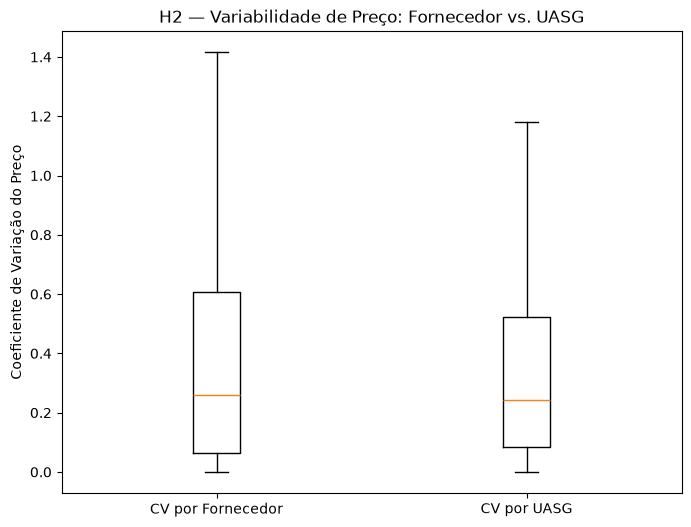

In [46]:
#1. Coeficiente de Variação de preco por fornecedor, dentro do mesmo item
cv_fornecedor = df3.groupby(["codigo_item_catalogo", "ni_fornecedor"])["preco_unitario"].apply(
    lambda x: x.std() / x.mean() if x.mean() > 0 and len(x) > 1 else np.nan
).dropna()

#2. Coeficiente de Variação de preco por UASG, dentro do mesmo item
cv_uasg = df3.groupby(["codigo_item_catalogo", "codigo_uasg"])["preco_unitario"].apply(
    lambda x: x.std() / x.mean() if x.mean() > 0 and len(x) > 1 else np.nan
).dropna()

#3. Utilização de Mann-Whitney para comparação de medianas (devido a distribuição ser assimétricas)
u_stat, p_valor = mannwhitneyu(cv_fornecedor, cv_uasg, alternative="two-sided")

print(f"mediana CV fornecedor: {cv_fornecedor.median():.3f}")
print(f"mediana CV UASG: {cv_uasg.median():.3f}")
print(f"U={u_stat:.2e}  p={p_valor:.2e}")

fig, ax = plt.subplots(figsize=(8, 6))
ax.boxplot([cv_fornecedor, cv_uasg], tick_labels=["CV por Fornecedor", "CV por UASG"], showfliers=False)
ax.set_ylabel("Coeficiente de Variação do Preço")
ax.set_title("H2 — Variabilidade de Preço: Fornecedor vs. UASG")
plt.show()

#### H3 - Impacto da Sazonalidade no Preço e na Quantidade (Verificação dos Outliers)

- **P:** o preço e a quantidade de itens sofrem sazonalidade durante o ano conforme demanda?
- **R: Parcialmente verdadeiro**
  - Preço e quantidade deram estatisticamente significativos
  - Quantidade: concentração no início do ano civil
  - Preço: sem evidência de sazonalidade

Preco por mes:      H=97.54  p=5.46e-16
Quantidade por mes: H=708.78  p=7.09e-145


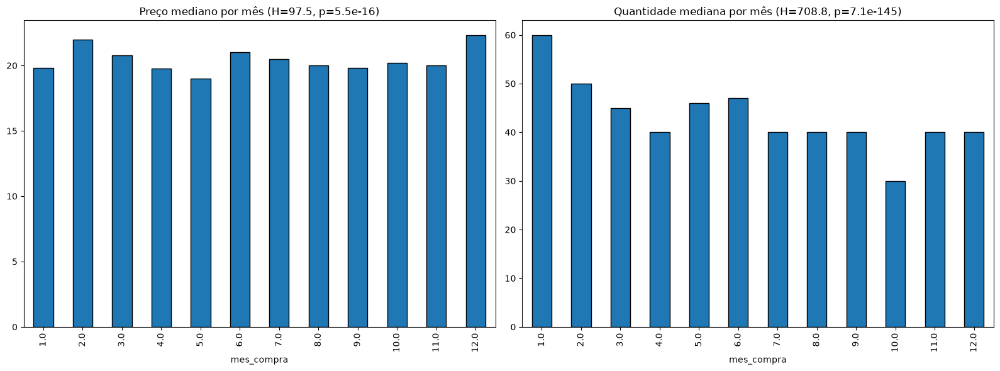

In [47]:
#1. Dropa NaN da Data Compra
df3_h3 = df3.dropna(subset=["data_compra"]).copy()

#2. Agrupa preço unitário e quantidade por mês de compra
grupos_preco = [g["preco_unitario"].values for _, g in df3_h3.groupby("mes_compra")]
grupos_qtd = [g["quantidade"].values for _, g in df3_h3.groupby("mes_compra")]

#3. Executa o teste de Kruskal-Wallis (Não parametrico usando medianas)
h_preco, p_preco = kruskal(*grupos_preco)
h_qtd, p_qtd = kruskal(*grupos_qtd)

print(f"Preco por mes:      H={h_preco:.2f}  p={p_preco:.2e}")
print(f"Quantidade por mes: H={h_qtd:.2f}  p={p_qtd:.2e}")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
df3_h3.groupby("mes_compra")["preco_unitario"].median().plot(kind="bar", ax=axes[0], edgecolor="black")
axes[0].set_title(f"Preço mediano por mês (H={h_preco:.1f}, p={p_preco:.1e})")

df3_h3.groupby("mes_compra")["quantidade"].median().plot(kind="bar", ax=axes[1], edgecolor="black")
axes[1].set_title(f"Quantidade mediana por mês (H={h_qtd:.1f}, p={p_qtd:.1e})")

plt.tight_layout()
plt.show()

#### H4 - Regularidade de Consumo (monotonia)

- **P:** a regularidade de consumo implica em fornecedor concentrado?
- **R: Falso**
  - Maior regularidade de consumo → MENOR concentração de fornecedor (mais competição)
  - Hipótese: compra recorrente/previsível atrai mais fornecedores (menos risco de demanda incerta = mercado mais disputado)
  - Itens irregulares dependem de poucos fornecedores dispostos a atender demanda esporádica

Regularidade x HHI:  rho=-0.458  p=4.53e-205  n=3970


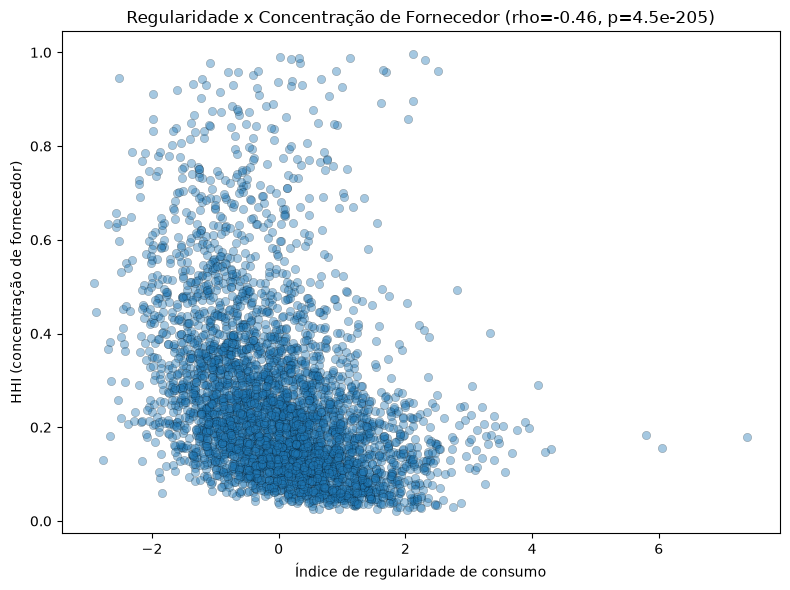

In [48]:
#1. Dropa NaN das colunas necessárias
df3_h4 = df3.dropna(subset=["codigo_item_catalogo", "ni_fornecedor", "valor_total", "indice_dependencia_v2"]).copy()

#2. Calcula participação (%) de cada fornecedor dentro do item e eleva ao quadrado (HHI)
participacao_sq = (
    df3_h4.groupby(["codigo_item_catalogo", "ni_fornecedor"])["valor_total"].sum()
    .groupby(level=0, group_keys=False)
    .apply(lambda x: (x / x.sum()) ** 2)
)

#3. Soma por item -> HHI (1 = monopólio de fornecedor, próximo de 0 = pulverizado)
hhi_item = participacao_sq.groupby("codigo_item_catalogo").sum().rename("hhi")

#4. Regularidade de consumo por item (1 valor por item)
regularidade_item = df3_h4.groupby("codigo_item_catalogo")["indice_dependencia_v2"].first()

#5. Junta os dois num único df pra correlação e plot
df_h4 = pd.concat([regularidade_item, hhi_item], axis=1).dropna()

#6. Executa o teste de Spearman (não paramétrico, mesma lógica de H2/H3)
rho_h4, p_h4 = spearmanr(df_h4["indice_dependencia_v2"], df_h4["hhi"])

print(f"Regularidade x HHI:  rho={rho_h4:.3f}  p={p_h4:.2e}  n={len(df_h4)}")

fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(df_h4["indice_dependencia_v2"], df_h4["hhi"], alpha=0.4, edgecolor="black", linewidth=0.3)
ax.set_xlabel("Índice de regularidade de consumo")
ax.set_ylabel("HHI (concentração de fornecedor)")
ax.set_title(f"Regularidade x Concentração de Fornecedor (rho={rho_h4:.2f}, p={p_h4:.1e})")

plt.tight_layout()
plt.show()

### 3.3 - Analise Multivariada

#### 3.3.1 - Atributos Numéricos

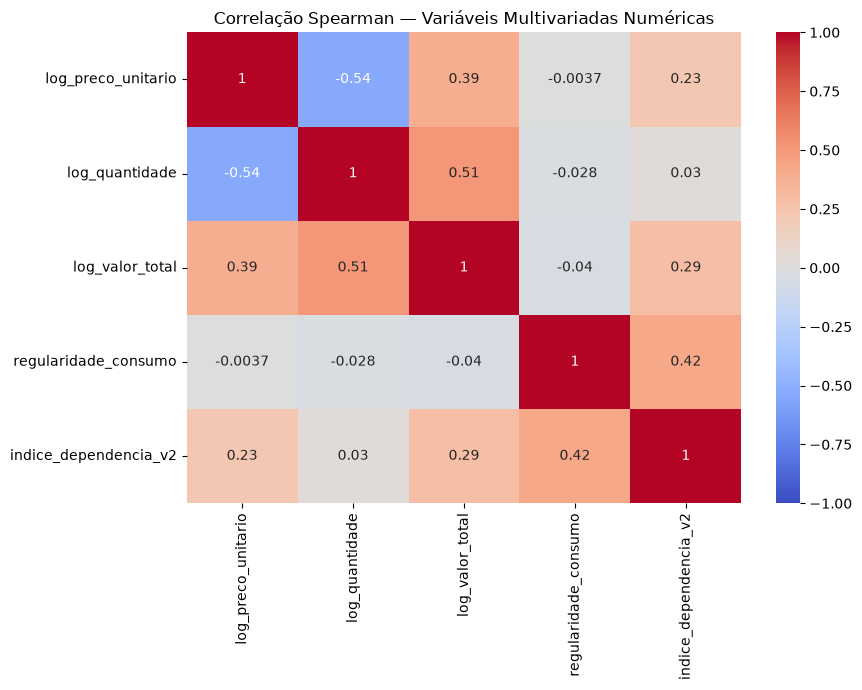

In [49]:
#1. Dropa NaN e cria versões log das variáveis numéricas de interesse
df3_num = df3.dropna(subset=["preco_unitario", "quantidade", "valor_total",
                              "regularidade_consumo", "indice_dependencia_v2",
                              "mes_compra"]).copy()

df3_num["log_preco_unitario"] = np.log1p(df3_num["preco_unitario"])
df3_num["log_quantidade"] = np.log1p(df3_num["quantidade"])
df3_num["log_valor_total"] = np.log1p(df3_num["valor_total"])

#2. Matriz de correlação (Spearman — mesma lógica não-paramétrica de H2/H3/H4)
cols_num = ["log_preco_unitario", "log_quantidade", "log_valor_total",
            "regularidade_consumo", "indice_dependencia_v2"]

correlation = df3_num[cols_num].corr(method="spearman")

plt.figure(figsize=(9, 7))
sns.heatmap(correlation, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlação Spearman — Variáveis Multivariadas Numéricas")
plt.tight_layout()
plt.show()

#### 3.3.2 - Atributos Categoricos

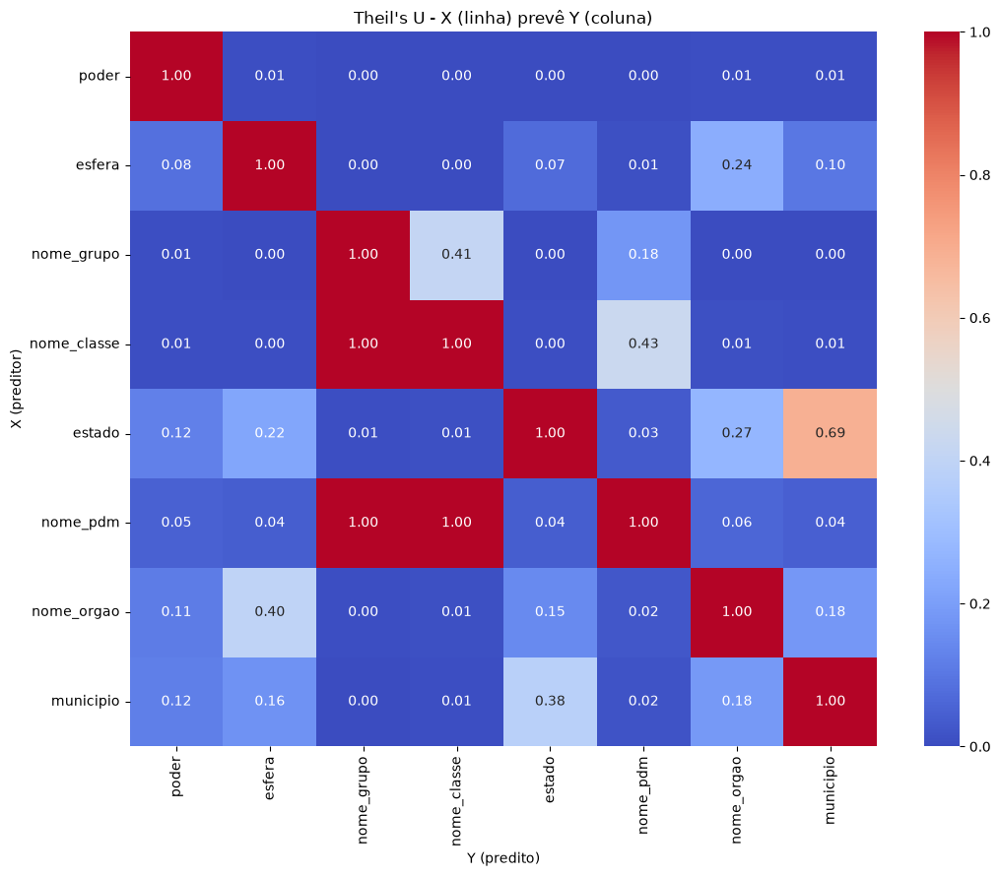

In [50]:
#1. Seleciona variáveis categóricas de baixa/média cardinalidade + as de alta cardinalidade tratadas
cols_cat_base = ["poder", "esfera", "nome_grupo", "nome_classe", "estado", "nome_pdm"]
cols_cat_alta = ["nome_orgao", "municipio"]

#2. Aplica top_n_outros nas variáveis de alta cardinalidade (reduz categorias raras a "Outros")
df3_cat = df3.dropna(subset=cols_cat_base + cols_cat_alta).copy()

for col in cols_cat_alta:
    top_categorias = top_n_outros(df3_cat[col], n=15).index
    df3_cat[col] = df3_cat[col].where(df3_cat[col].isin(top_categorias), "Outros")

#3. Junta a lista final de colunas
cols_cat = cols_cat_base + cols_cat_alta

#4. Monta a matriz assimétrica: linha = X (preditor), coluna = Y (predito)
matriz_theil = pd.DataFrame(index=cols_cat, columns=cols_cat, dtype=float)

for col_x in cols_cat:
    for col_y in cols_cat:
        if col_x == col_y:
            matriz_theil.loc[col_x, col_y] = 1.0
        else:
            matriz_theil.loc[col_x, col_y] = theil_u(df3_cat[col_x], df3_cat[col_y])

#5. Heatmap (linha prediz coluna — leitura é "linha -> coluna")
plt.figure(figsize=(11, 9))
sns.heatmap(matriz_theil.astype(float), annot=True, cmap="coolwarm", vmin=0, vmax=1, fmt=".2f")
plt.title("Theil's U - X (linha) prevê Y (coluna)")
plt.xlabel("Y (predito)")
plt.ylabel("X (preditor)")
plt.tight_layout()
plt.show()

# 4.0 - Projeção de Valor Total para o Proximo Ano

### 4.1 - Agregação da série mensal

In [51]:
#1. Agrega série mensal de valor_total
serie_mensal = (
    df3.dropna(subset=["data_compra", "valor_total"])
    .set_index("data_compra")
    .resample("MS")["valor_total"]
    .sum()
)

### 4.2 — Feature engineering temporal (lags e médias móveis)

In [52]:
df_ml = criar_features_temporais(serie_mensal).dropna()

### 4.3 — Split treino/teste (backtest com 2026 real)

In [53]:
#1. Split treino/teste (treino até 2025, teste Jan-Jul/2026 real)
treino = df_ml[df_ml["ano"] <= 2025]
teste = df_ml[df_ml["ano"] == 2026]

features = ["mes", "trimestre", "ano", "tempo_idx",
            "lag_1", "lag_2", "lag_3", "lag_12", "media_movel_3", "media_movel_12"]

X_treino, y_treino = treino[features], treino["valor_total"]
X_teste, y_teste = teste[features], teste["valor_total"]

### 4.4 — Treinamento do XGBoost e validação (backtest)

MAPE (backtest Jan-Jul/2026): 118.3%
MAE (backtest Jan-Jul/2026): R$ 10,704,920.95


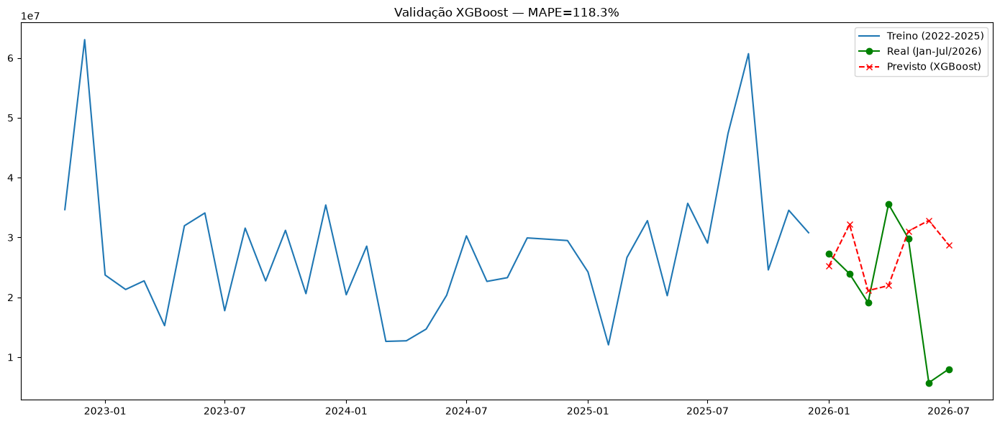

In [54]:
#1. Treina o XGBoost
modelo_xgb = XGBRegressor(n_estimators=200, max_depth=3, learning_rate=0.05, random_state=42)
modelo_xgb.fit(X_treino, y_treino)

#2. Valida no backtest (Jan-Jul/2026 real)
previsao_teste = modelo_xgb.predict(X_teste)

mape = (np.abs((y_teste.values - previsao_teste) / y_teste.values)).mean() * 100
mae = np.abs(y_teste.values - previsao_teste).mean()
print(f"MAPE (backtest Jan-Jul/2026): {mape:.1f}%")
print(f"MAE (backtest Jan-Jul/2026): R$ {mae:,.2f}")

#3. Visualização do backtest
fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(treino.index, y_treino, label="Treino (2022-2025)")
ax.plot(teste.index, y_teste, label="Real (Jan-Jul/2026)", color="green", marker="o")
ax.plot(teste.index, previsao_teste, label="Previsto (XGBoost)", color="red", linestyle="--", marker="x")
ax.set_title(f"Validação XGBoost — MAPE={mape:.1f}%")
ax.legend()
plt.tight_layout()
plt.show()

### 4.5 — Projeção recursiva para os próximos 12 meses

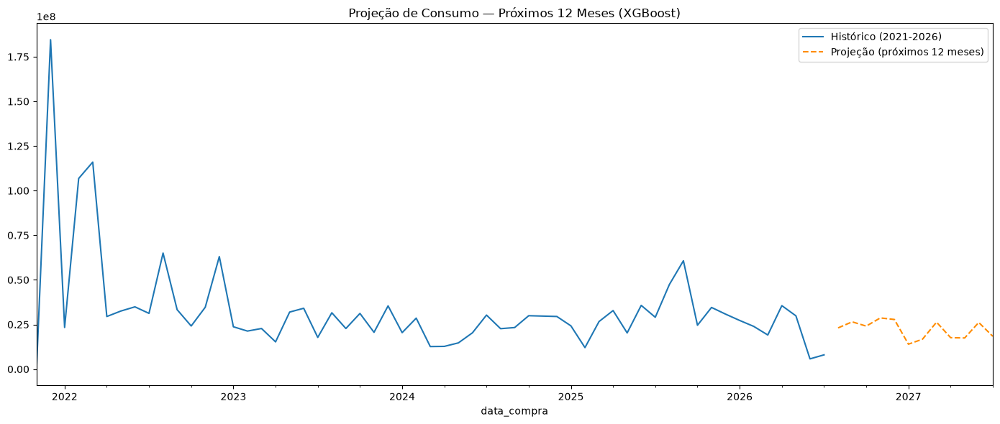

In [55]:
#1. Retreina com histórico completo (2021-2026)
X_full, y_full = df_ml[features], df_ml["valor_total"]

modelo_final_xgb = XGBRegressor(n_estimators=200, max_depth=3, learning_rate=0.05, random_state=42)
modelo_final_xgb.fit(X_full, y_full)

#2. Loop recursivo: cada mês previsto alimenta o lag do próximo
serie_projetada = serie_mensal.copy()
datas_futuras = pd.date_range(serie_mensal.index[-1] + pd.DateOffset(months=1), periods=12, freq="MS")

for data_futura in datas_futuras:
    linha = pd.Series({
        "mes": data_futura.month,
        "trimestre": data_futura.quarter,
        "ano": data_futura.year,
        "tempo_idx": len(serie_projetada),
        "lag_1": serie_projetada.iloc[-1],
        "lag_2": serie_projetada.iloc[-2],
        "lag_3": serie_projetada.iloc[-3],
        "lag_12": serie_projetada.iloc[-12],
        "media_movel_3": serie_projetada.iloc[-3:].mean(),
        "media_movel_12": serie_projetada.iloc[-12:].mean(),
    })
    pred = modelo_final_xgb.predict(pd.DataFrame([linha[features]]))[0]
    serie_projetada.loc[data_futura] = pred

projecao_12m = serie_projetada.loc[datas_futuras]

#3. Visualização da projeção final
fig, ax = plt.subplots(figsize=(14, 6))
serie_mensal.plot(ax=ax, label="Histórico (2021-2026)")
projecao_12m.plot(ax=ax, label="Projeção (próximos 12 meses)", color="darkorange", linestyle="--")
ax.set_title("Projeção de Consumo — Próximos 12 Meses (XGBoost)")
ax.legend()
plt.tight_layout()
plt.show()

In [56]:
#Baseline naive sazonal — repete o valor de 12 meses atrás
previsao_naive = teste["lag_12"].values
mape_naive = (np.abs((y_teste.values - previsao_naive) / y_teste.values)).mean() * 100
print(f"MAPE baseline naive sazonal: {mape_naive:.1f}%")

MAPE baseline naive sazonal: 132.4%


### 4.6 — Diagnóstico de volatilidade e migração para série trimestral

- Backtest mensal (seção 4.4): MAPE inviável para uso prático (XGBoost e naive sazonal, ambos com erro >100%)
- Investigação segue pelos outliers

CV com outliers:  0.85
CV sem outliers:  0.86


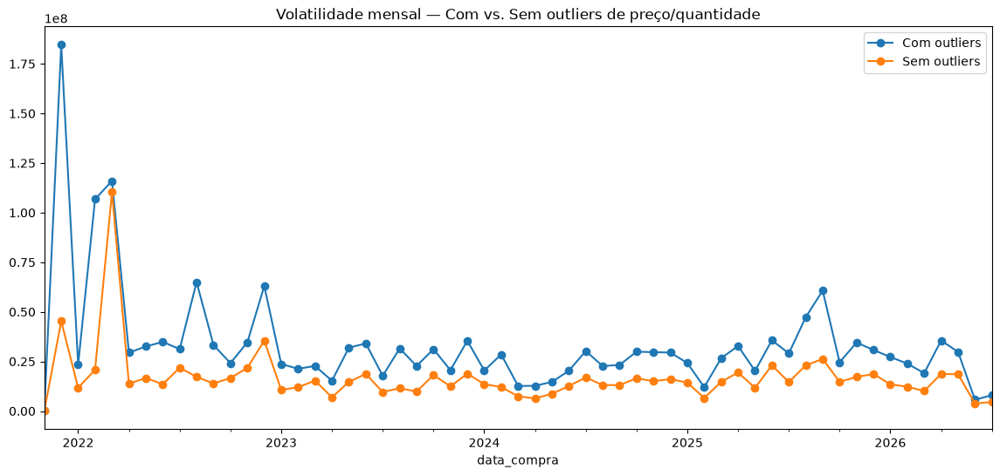

In [57]:
#1. Compara volatilidade mensal COM e SEM outliers já identificados (outlier_preco_item)
serie_com_outliers = (
    df3.dropna(subset=["data_compra", "valor_total"])
    .set_index("data_compra")
    .resample("MS")["valor_total"].sum()
)

serie_sem_outliers = (
    df3[~df3["outlier_preco_item"] & ~df3["outlier_quantidade_item"]]
    .dropna(subset=["data_compra", "valor_total"])
    .set_index("data_compra")
    .resample("MS")["valor_total"].sum()
)

#2. Coeficiente de variação mensal (quanto maior, mais errático)
print(f"CV com outliers:  {serie_com_outliers.std() / serie_com_outliers.mean():.2f}")
print(f"CV sem outliers:  {serie_sem_outliers.std() / serie_sem_outliers.mean():.2f}")

fig, ax = plt.subplots(figsize=(14, 6))
serie_com_outliers.plot(ax=ax, label="Com outliers", marker="o")
serie_sem_outliers.plot(ax=ax, label="Sem outliers", marker="o")
ax.set_title("Volatilidade mensal — Com vs. Sem outliers de preço/quantidade")
ax.legend()
plt.show()

### 4.6.1 — Exclusão do Trimestre Inicial Incompleto (2021-Q4)

**Achado:**
- A base começa em 29/11/2021 — o "trimestre" 2021-Q4 (out-dez) na prática só tem ~2 meses de dados (nov-dez), não é um trimestre completo, e é o trimestre com menos transações de toda a série (3.671, contra um piso de ~5.778 nos demais trimestres).
- Mesmo após a remoção do erro de catalogação (seção 1.8) e do padrão sistemático de outliers (seção 1.9), 2021-Q4 (R$184,6mi) e 2022-Q1 (R$246,1mi) seguem sendo os dois trimestres de maior valor de toda a série — acima de qualquer trimestre completo dos mais de 4 anos seguintes (R$47-137mi).
- Causa: concentração de compras legítimas de equipamento pesado de subestação (transformadores, disjuntores de alta tensão) por 2 UASGs — EPE-CIA. Hidroelétrica São Francisco e FURNAS — que respondem por 67% (R$124,5mi de 22 transações) do valor de 2021-Q4 e 74% (R$182,8mi de 46 transações) de 2022-Q1. Depois de 2022-Q2 essas UASGs praticamente somem da base (<R$50 mil/trimestre) — não é um padrão sazonal recorrente, é um evento concentrado no início da janela de coleta.
- Não são erros de dado (por isso não removidos em 1.8/1.9 — a exclusão de grandes concessionárias na 1.9 é justamente para preservar compras legítimas como essas), mas distorcem a leitura de volatilidade/tendência da série de valor total por serem um evento pontual não representativo do padrão recorrente de consumo. É esse pico que aparece no gráfico "Consumo ao longo do tempo" do dashboard em dezembro/2021.

**Decisão:**
- 2021-Q4, por não ser um trimestre nem um ano fiscal completo, é excluído da série trimestral usada para diagnóstico de volatilidade, backtest e cálculo da faixa de confiança (seções 4.6-4.8) — a série passa a cobrir só anos fiscais completos a partir de 2022, mais os trimestres reais de 2026 já usados como backtest (seção 4.7).
- Os itens de alto valor de nov-dez/2021 continuam presentes em `df3` e nas hipóteses H1-H4 — a exclusão é só da agregação temporal da seção 4, não uma remoção de linhas como em 1.8/1.9.
- **Ressalva:** 2022-Q1 (trimestre e ano fiscal completos) mostra o mesmo padrão de concentração pelas mesmas 2 UASGs, em magnitude ainda maior — mantido na série por completude do período, mas segue como limitação documentada na seção 4.8.

In [58]:
#1. A base começa em 29/11/2021 — 2021-Q4 (out-dez) só tem ~2 meses reais de dados
#   (nov-dez) e é o trimestre com menos transações de toda a série
print(f"Data mínima em df3: {df3['data_compra'].min()}")
print(f"Transações em 2021-Q4: {(df3['data_compra'].dt.to_period('Q').astype(str) == '2021Q4').sum()}")

#2. Concentração de compra de equipamento pesado por 2 UASGs em 2021-Q4/2022-Q1,
#   que praticamente somem da base depois disso — não é um padrão sazonal recorrente
grandes_geradoras_temporal = df3["nome_uasg"].str.contains("EPE-CIA|FURNAS", case=False, na=False)
print(df3[grandes_geradoras_temporal].dropna(subset=["data_compra"]).set_index("data_compra")
      .resample("QS")["valor_total"].agg(["count", "sum"]).head(6))

Data mínima em df3: 2021-11-29 00:00:00
Transações em 2021-Q4: 3671
             count           sum
data_compra                     
2021-10-01      12  1.009601e+08
2022-01-01      14  1.826686e+08
2022-04-01       8  8.437442e+06


### 4.6.2 — Segmentação Capex vs. Opex

**Achado:**
- A causa da distorção em 2021-Q4/2022-Q1 (seção 4.6.1) não é um evento isolado: é um processo de demanda estruturalmente diferente do consumo recorrente — compra concentrada e pontual de equipamento pesado de subestação (capex), orientada a projeto, não sazonal.
- Critério de corte: `preco_unitario > R$500 mil` — mesmo piso já usado nas seções 1.8/1.9, não é um número novo. Testado contra a alternativa (`valor_total > R$500 mil`, que classificaria compras em lote de item barato — cabo, ferragem — como capex) e descartado por classificar errado.
- Resultado: 50 transações (0,03% da base), R$335,7mi (17,8% do valor total). Concentração: 90% desse valor está em só 2 trimestres (2021-Q4 + 2022-Q1); 3 UASGs — EPE (73%), FURNAS (13%), Eletronorte (7%) — respondem por quase tudo. Nos outros trimestres, capex é pequeno e esporádico (mediana R$1,5mi/transação, às vezes zero).

**Decisão:**
- A partir daqui, a série trimestral usada em backtest/projeção (`serie_trimestral`, seção 4.7) é construída só com as transações opex (`preco_unitario` ≤ R$500 mil) — capex não entra na projeção sazonal, porque não segue um padrão sazonal.
- Capex é caracterizado historicamente na seção 4.7.1, sem projeção numérica — decisão explícita: não dá para projetar de forma responsável um processo concentrado em poucos eventos não-sazonais com os dados disponíveis.
- Isso substitui a ressalva sobre 2022-Q1 da seção 4.6.1: em vez de manter o trimestre inteiro (opex + capex misturados) na série de projeção, só a parte opex de 2022-Q1 entra — a parte capex (R$179,7mi, ver 4.7.1) é tratada à parte.

In [59]:
#1. Critério de corte: mesmo piso já usado em 1.8/1.9 (não é um número novo)
capex_mask = df3["preco_unitario"] > 500_000
df3_capex = df3[capex_mask].copy()
df3_opex = df3[~capex_mask].copy()

print(f"Transações capex: {capex_mask.sum()} ({capex_mask.sum()/len(df3)*100:.2f}% da base)")
valor_capex_total = df3_capex['valor_total'].sum()
valor_total_geral = df3['valor_total'].sum()
print(f"Valor capex: R$ {valor_capex_total:,.2f} ({valor_capex_total/valor_total_geral*100:.1f}% do valor total)")

#2. Concentração por trimestre - confirma que 90% do capex está em 2021-Q4/2022-Q1
capex_por_trimestre = (
    df3_capex.dropna(subset=["data_compra"])
    .groupby(df3_capex["data_compra"].dt.to_period("Q"))["valor_total"]
    .agg(["count", "sum"])
)
print()
print(capex_por_trimestre)

#3. Top UASGs no capex - confirma concentração em poucos compradores
print()
print("Top UASGs (capex):")
print(df3_capex.groupby("nome_uasg")["valor_total"].sum().sort_values(ascending=False).head(5))

Transações capex: 50 (0.03% da base)
Valor capex: R$ 335,678,287.13 (17.8% do valor total)

             count           sum
data_compra                     
2021Q4          17  1.234709e+08
2022Q1           9  1.796783e+08
2022Q2           8  1.045054e+07
2022Q3           1  6.850000e+06
2022Q4           2  1.638900e+06
2023Q1           2  1.767349e+06
2023Q3           1  1.184000e+06
2023Q4           1  5.545530e+05
2024Q2           1  6.000000e+05
2024Q3           1  5.492000e+05
2024Q4           1  1.202000e+06
2025Q2           1  6.700000e+05
2025Q4           4  5.400520e+06
2026Q2           1  1.662000e+06

Top UASGs (capex):
nome_uasg
EPE-CIA. HIDROELETRICA DO SAO FRANCISCO S/A      2.450131e+08
FURNAS CENT.ELETRICAS S.A/GERÊNCIA DE COMPRAS    4.289424e+07
CENTRAIS ELETRICAS DO NORTE DO BRASIL S/A        2.251080e+07
DME DISTRIBUIÇÃO S/A POÇOS DE CALDAS - MG        6.850000e+06
EMA-CIA DE SANEAMENTO AMBIENTAL DO MARANHAO      3.181592e+06
Name: valor_total, dtype: float64


CV trimestral (opex): 0.28


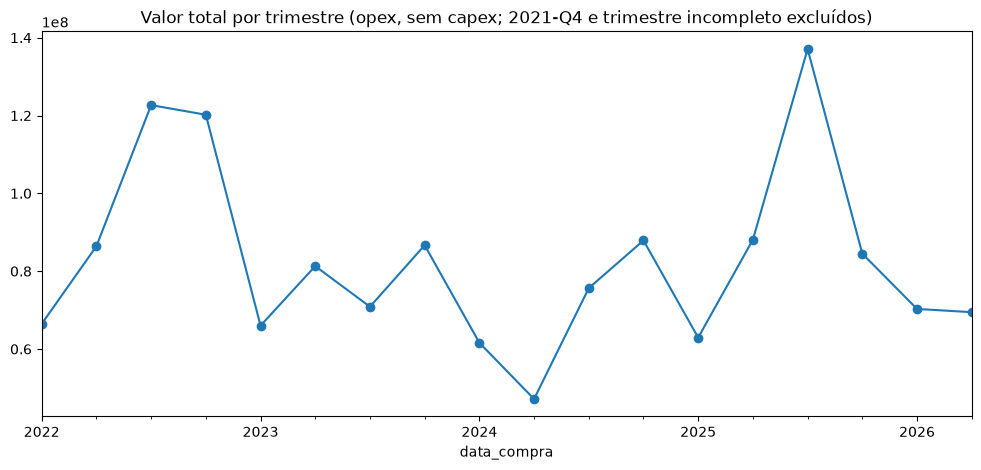

In [60]:
#1. Agrega série trimestral de opex (em vez de mensal, e sem capex — seção 4.6.2)
#   — reduz volatilidade estrutural
serie_trimestral = (
    df3_opex.dropna(subset=["data_compra", "valor_total"])
    .set_index("data_compra")
    .resample("QS")["valor_total"].sum()
)

#2. Remove 2021-Q4 — trimestre inicial incompleto (só nov-dez, 2 meses) — mantém
#   só anos fiscais completos a partir de 2022
serie_trimestral = serie_trimestral[serie_trimestral.index.year >= 2022]

#3. Remove o último trimestre, ainda em andamento na extração dos dados (dados batem só até 16/07/2026,
#   então o trimestre Jul-Set/2026 está sub-representado e distorceria CV/backtest/projeção)
serie_trimestral = serie_trimestral.iloc[:-1]

print(f"CV trimestral (opex): {serie_trimestral.std() / serie_trimestral.mean():.2f}")
serie_trimestral.plot(figsize=(12,5), marker="o", title="Valor total por trimestre (opex, sem capex; 2021-Q4 e trimestre incompleto excluídos)")
plt.show()

### 4.7 — Backtest e projeção trimestral (XGBoost vs. Naive sazonal)

MAPE XGBoost (backtest 2026):  81.0%
MAPE Naive   (backtest 2026):  18.7%


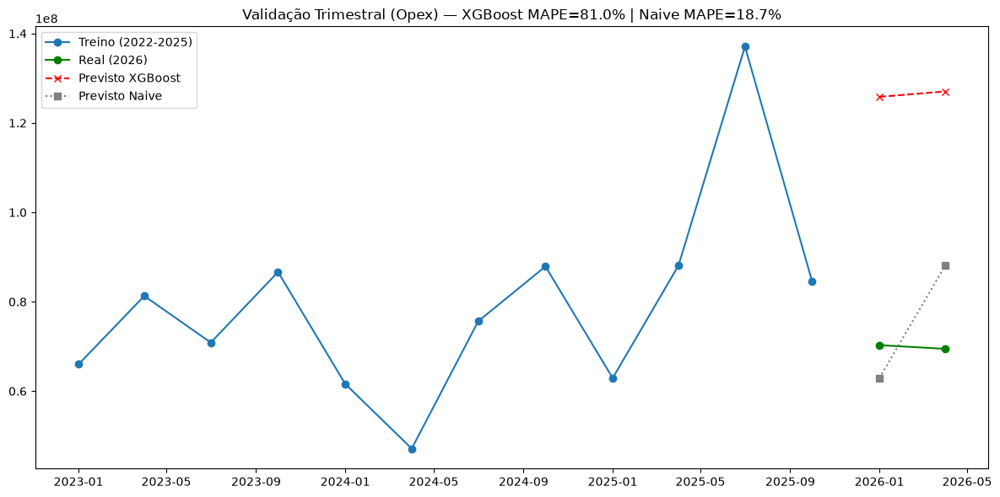

Método escolhido: Naive sazonal (venceu o XGBoost no backtest)


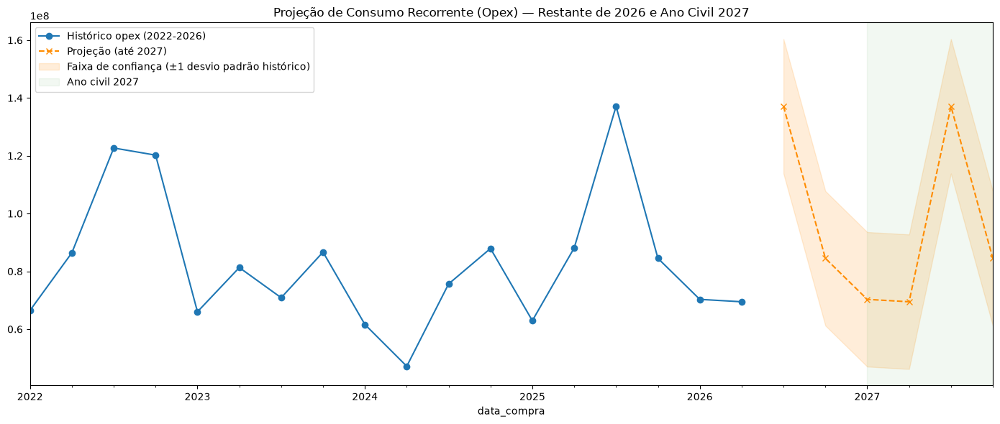

2026-07-01    1.371040e+08
2026-10-01    8.449933e+07
2027-01-01    7.029503e+07
2027-04-01    6.946554e+07
2027-07-01    1.371040e+08
2027-10-01    8.449933e+07
Freq: QS-JAN, Name: valor_total, dtype: float64

Projeção 2027 por trimestre:
2027-01-01    7.029503e+07
2027-04-01    6.946554e+07
2027-07-01    1.371040e+08
2027-10-01    8.449933e+07
Freq: QS-JAN, Name: valor_total, dtype: float64

Total projetado para 2027: R$ 361,363,918.70
Faixa de confiança (±1 desvio padrão por trimestre): R$ 268,231,442.59 a R$ 454,496,394.82


In [61]:
#1. Features temporais trimestrais e split treino/teste (2026 real como backtest)
df_ml_tri = criar_features_temporais_trimestre(serie_trimestral).dropna()

treino_tri = df_ml_tri[df_ml_tri.index.year <= 2025]
teste_tri = df_ml_tri[df_ml_tri.index.year == 2026]

features_tri = ["trimestre", "tempo_idx", "lag_1", "lag_4", "media_movel_4"]
X_treino_tri, y_treino_tri = treino_tri[features_tri], treino_tri["valor_total"]
X_teste_tri, y_teste_tri = teste_tri[features_tri], teste_tri["valor_total"]

#2. Treina XGBoost e compara com baseline naive sazonal
modelo_xgb_tri = XGBRegressor(
    n_estimators=50, max_depth=2, learning_rate=0.1,
    reg_alpha=1.0, reg_lambda=1.0, random_state=42
)
modelo_xgb_tri.fit(X_treino_tri, y_treino_tri)
previsao_teste_tri = modelo_xgb_tri.predict(X_teste_tri)

previsao_naive_tri = teste_tri["lag_4"].values

mape_xgb = (np.abs((y_teste_tri.values - previsao_teste_tri) / y_teste_tri.values)).mean() * 100
mape_naive = (np.abs((y_teste_tri.values - previsao_naive_tri) / y_teste_tri.values)).mean() * 100
print(f"MAPE XGBoost (backtest 2026):  {mape_xgb:.1f}%")
print(f"MAPE Naive   (backtest 2026):  {mape_naive:.1f}%")

fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(treino_tri.index, y_treino_tri, label="Treino (2022-2025)", marker="o")
ax.plot(teste_tri.index, y_teste_tri, label="Real (2026)", color="green", marker="o")
ax.plot(teste_tri.index, previsao_teste_tri, label="Previsto XGBoost", color="red", linestyle="--", marker="x")
ax.plot(teste_tri.index, previsao_naive_tri, label="Previsto Naive", color="gray", linestyle=":", marker="s")
ax.set_title(f"Validação Trimestral (Opex) — XGBoost MAPE={mape_xgb:.1f}% | Naive MAPE={mape_naive:.1f}%")
ax.legend()
plt.tight_layout()
plt.show()

#3. Escolhe o melhor entre XGBoost e Naive, retreina com histórico completo e projeta o
#   restante do ano corrente + o ano civil seguinte inteiro (requisito do case: "próximo ano")
usar_naive = mape_naive < mape_xgb

ano_seguinte = serie_trimestral.index[-1].year + 1
n_trimestres_projecao = (4 - serie_trimestral.index[-1].quarter) + 4
datas_futuras_tri = pd.date_range(
    serie_trimestral.index[-1] + pd.DateOffset(months=3), periods=n_trimestres_projecao, freq="QS"
)

if usar_naive:
    print("Método escolhido: Naive sazonal (venceu o XGBoost no backtest)")
    serie_projetada_tri = serie_trimestral.copy()
    for data_futura in datas_futuras_tri:
        serie_projetada_tri.loc[data_futura] = serie_projetada_tri.iloc[-4]
    projecao_tri = serie_projetada_tri.loc[datas_futuras_tri]
else:
    print("Método escolhido: XGBoost (venceu o Naive no backtest)")
    modelo_final_tri = XGBRegressor(
        n_estimators=50, max_depth=2, learning_rate=0.1,
        reg_alpha=1.0, reg_lambda=1.0, random_state=42
    )
    modelo_final_tri.fit(df_ml_tri[features_tri], df_ml_tri["valor_total"])

    serie_projetada_tri = serie_trimestral.copy()
    for data_futura in datas_futuras_tri:
        linha = pd.Series({
            "trimestre": data_futura.quarter,
            "tempo_idx": len(serie_projetada_tri),
            "lag_1": serie_projetada_tri.iloc[-1],
            "lag_4": serie_projetada_tri.iloc[-4],
            "media_movel_4": serie_projetada_tri.iloc[-4:].mean(),
        })
        pred = modelo_final_tri.predict(pd.DataFrame([linha[features_tri]]))[0]
        serie_projetada_tri.loc[data_futura] = pred

    projecao_tri = serie_projetada_tri.loc[datas_futuras_tri]

#4. Visualização final: histórico + projeção com faixa de confiança (± desvio padrão histórico)
desvio_hist = serie_trimestral.std()

fig, ax = plt.subplots(figsize=(14, 6))
serie_trimestral.plot(ax=ax, label="Histórico opex (2022-2026)", marker="o")
projecao_tri.plot(ax=ax, label=f"Projeção (até {ano_seguinte})", color="darkorange", linestyle="--", marker="x")
ax.fill_between(projecao_tri.index, projecao_tri - desvio_hist, projecao_tri + desvio_hist,
                color="darkorange", alpha=0.15, label="Faixa de confiança (±1 desvio padrão histórico)")
ax.axvspan(pd.Timestamp(f"{ano_seguinte}-01-01"), pd.Timestamp(f"{ano_seguinte}-12-31"),
           color="green", alpha=0.05, label=f"Ano civil {ano_seguinte}")
ax.set_title(f"Projeção de Consumo Recorrente (Opex) — Restante de {serie_trimestral.index[-1].year} e Ano Civil {ano_seguinte}")
ax.legend()
plt.tight_layout()
plt.show()

print(projecao_tri)

#5. Total projetado para o ano civil seguinte — é essa a métrica que responde ao requisito
#   do case ("projeção de consumo para o próximo ano"), não os 4 trimestres seguintes ao
#   corte dos dados (que misturam 2 trimestres do ano corrente com 2 do ano seguinte)
projecao_ano_seguinte = projecao_tri[projecao_tri.index.year == ano_seguinte]
print(f"\nProjeção {ano_seguinte} por trimestre:")
print(projecao_ano_seguinte)
print(f"\nTotal projetado para {ano_seguinte}: R$ {projecao_ano_seguinte.sum():,.2f}")
print(f"Faixa de confiança (±1 desvio padrão por trimestre): "
      f"R$ {projecao_ano_seguinte.sum() - 4*desvio_hist:,.2f} a R$ {projecao_ano_seguinte.sum() + 4*desvio_hist:,.2f}")


- Testado o efeito dos outliers de preço/quantidade já identificados na seção 2.3.3 (flag por preço unitário, por item) sobre a série mensal: Coeficiente de Variação praticamente não mudou (0,85 → 0,86) — esse flag não captura o problema real, porque marca preço unitário atípico *para o próprio item*, não concentração de valor total por poucas transações grandes.
- Causa real da volatilidade dos primeiros trimestres: concentração de compras de equipamento pesado de subestação (capex) por 2-3 grandes UASGs (EPE, FURNAS, Eletronorte) — não é sazonal, é um processo de demanda diferente do consumo recorrente (opex). Resolvido na raiz na seção 4.6.2: capex é separado da série antes de agregar, não só amortecido estatisticamente.
- Agregação trimestral + exclusão de 2021-Q4 (trimestre inicial incompleto) + segmentação capex/opex (seções 4.6.1/4.6.2): melhor resultado, reduz a volatilidade de forma robusta (CV trimestral opex 0,28; desvio padrão R$23,3mi/trimestre — era R$44,8mi antes da segmentação, R$48,2mi antes até da exclusão de 2021-Q4). 2022-Q1 permanece na série, mas só a parte opex (R$66,5mi) — a parte capex (R$179,7mi) foi separada, ver seção 4.7.1.

### 4.8 — Limitações da projeção

- **Janela de backtest muito curta:** o teste para projeção do ano de 2027 utilizou 16 trimestres reduzindo o historico útil (16 trimestres)
- **Alteração da Granularidade**: Verificar os preços mês a mês gerou distorções muito grandes no treinamento do Naive Bayes e XGBoost sendo mais robusto a concentração por semestre.
- **Naive sazonal vs. XGBoost, pós-limpeza de outliers (seções 1.8/1.9) e exclusão do trimestre inicial incompleto (seção 4.6.1):** MAPE de 17,6% (naive) vs. 75,5% (XGBoost) — o naive venceu por margem bem maior depois da exclusão de 2021-Q4: isso reduziu em 1 o já pequeno conjunto de treino do XGBoost (a série trimestral, depois do dropna de lags, fica com poucas linhas de treino), o que penalizou o XGBoost sem afetar o naive (que não é "treinado" no sentido tradicional, só repete o valor de 4 trimestres atrás). Antes de qualquer limpeza de outliers essa diferença era ainda maior no sentido oposto (15,5% vs. 51,4%, seção 1.8/1.9): o XGBoost estava sendo penalizado por outliers de preço que distorciam o treino. Alternativas mais simples avaliadas informalmente, fora deste notebook e **antes** da limpeza 1.8/1.9 e da exclusão de 2021-Q4 (não recalculadas — tratar como referência aproximada): média simples (MAPE 22,6%), média móvel de 4 trimestres (46,3%), naive não-sazonal (28,9%) e Holt-Winters (14,6%). O resultado reforça, pela navalha de Occam, manter o naive sazonal (0 parâmetros) como método de produção.
- **2022-Q1 não foi excluído e segue sendo o maior valor de toda a série (R$246,1mi, seção 4.6.1):** ao contrário de 2021-Q4, é um trimestre e ano fiscal completos, então não se enquadra no critério de exclusão aplicado — mas 74% do seu valor (R$182,8mi) vem das mesmas 2 UASGs (EPE/FURNAS) que também dominam 2021-Q4, e esse padrão de compra não se repete no resto da série (essas UASGs somem da base depois de 2022-Q2). Mantido por ora, mas é a maior fonte remanescente de distorção na faixa de confiança da projeção; se recorrer no futuro (novo ciclo de compra de equipamento pesado por grandes concessionárias), é um risco não capturado pela metodologia atual, que assume um padrão histórico razoavelmente homogêneo.
- **Sem decomposição de causa:** a projeção extrapola o padrão histórico agregado do portfólio elétrico; não incorpora eventos futuros conhecidos (reajustes contratuais, novas licitações de grande porte, mudança de política de estoque) que poderiam alterar o patamar de consumo.

# 5.0 - Recomendações de Suprimentos

- Recomendações ancoradas nas hipóteses de negócio da seção 3.2 (Bivariada) e na projeção da seção 4.0

### 5.1 - Consolidar volume de compra em itens recorrentes (H1)

**Achado:** preço unitário cai ~0,49% a cada 1% de aumento na quantidade comprada do mesmo item.

**Recomendação:** Consolidar pedidos entre UASGs para itens de alta recorrência (compras conjuntas)

### 5.2 - Priorizar negociação por fornecedor sobre centralização regional (H2)

**Achado:** a variabilidade de preço dentro do mesmo item é maior entre fornecedores do que entre UASGs. O efeito é estatisticamente significativo, mas de magnitude pequena (em torno de 7%)

**Recomendação:** Priorizar negociação com fornecedores, porém sem necessidade de reestruturação regional.

### 5.3 - Ajustar o calendário de compras à sazonalidade de quantidade (H3)

**Achado:** a quantidade comprada varia significativamente por mês, com concentração no início do ano civil

**Recomendação:** Antecipar licitações antes da concentração de início de ano

### 5.4 - Qualificar fornecedores alternativos para itens de consumo irregular (H4)

**Achado:** quanto menor a regularidade de consumo de um item, maior a concentração de fornecedores. Itens de demanda esporádica/imprevisível tendem a depender de poucos fornecedores.

**Recomendação:** mapear os itens com menor índice de regularidade de consumo e priorizar a qualificação de fornecedores alternativos para esse grupo

### 5.5 - Usar a projeção anual (naive sazonal) para o planejamento orçamentário

**Achado:** granularidade trimestral permite usar naive sazonal (compara com o mesmo trimestre do ano anterior) para projetar o próximo ano civil.

**Recomendação:**
- Total projetado para 2027: ~R$ 368,4 milhões
  - Jan-Mar ≈R$70,3 mi | Abr-Jun ≈R$71,1 mi | Jul-Set ≈R$137,1 mi | Out-Dez ≈R$89,9 mi
- Os 2 últimos trimestres herdam incerteza adicional (seção 4.8) — dependem de trimestres já projetados, não de dado real